# Data mining project - Bank marketing (part I)

## Jakub Muzyka & Krzysztof Jankowski 

## Project description
We using data related with marketing campaign to perform classification if clients were interested in the bank offer or not, by applying knowledge and methods from Data Mining course. Benefits on analysis and modeling may result in better recongnition of interested clients in ofers like this and therefore increase profiling offers. Better target (client) profile recognition may prevent money and time wasting.


## Loading Data


In [52]:
###MODULES###
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
import numpy as np
import random
import platform
from statsmodels.graphics.mosaicplot import mosaic
from sklearn.preprocessing import MinMaxScaler, KBinsDiscretizer


###CONFIG###
sns.set_theme()
%matplotlib inline
%reload_ext autoreload
%autoreload 2


sns.set(rc={'figure.figsize':(8,6)})

###VARIABLES###
DATA_DIR = "/home/zive_bewise/Documents/ML/DataMining/Project/Data" \
        if platform.system() == "Linux" else \
        "C:/Users/kubam/OneDrive/Desktop/studia/semestr 8/Data mining/DataMining-Project-Bank-Marketing"


In [53]:

df = pd.read_csv(f'{DATA_DIR}/bank-additional-full.csv', delimiter = ";")
features, labels = df.iloc[:, :-1], df.iloc[:, -1]

In [54]:
print(f"Features shape {features.shape}")
print(f"Features: {'  '.join(list(features.columns))}")
features.head(4)

Features shape (41188, 20)
Features: age  job  marital  education  default  housing  loan  contact  month  day_of_week  duration  campaign  pdays  previous  poutcome  emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0


In [192]:
print("Labels")
labels.head(4)

Labels


0    no
1    no
2    no
3    no
Name: y, dtype: object

## Data Description

The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. 
Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be ('yes') or not ('no') subscribed. 

Dataset contains 20 features and 41188 observations. There are following features related with client personal data:
1. __age__ age (numeric)
2. __type__ type of job; categorical variable: "admin.","blue-collar","entrepreneur","housemaid","management","retired","self-employed","services","student","technician","unemployed","unknown"
3. __marital__ marital status (categorical variable: "divorced","married","single","unknown"; note: "divorced" means divorced or widowed)
4. __education__ education (categorical variable: "basic.4y","basic.6y","basic.9y","high.school","illiterate","professional.course","university.degree","unknown")
5. __default__ has credit in default? (categorical variable: "no","yes","unknown")
6. __housing__ has housing loan? (categorical variable: "no","yes","unknown")
7. __loan__ has personal loan? (categorical variable: "no","yes","unknown")


There are following features related with the last contact of the current campaign:
1. __contract__ contact communication type (categorical variable: "cellular","telephone") 
2. __month__ last contact month of year (categorical variable: "jan", "feb", "mar", ..., "nov", "dec")
3. __day_of_week__ last contact day of the week (categorical variable: "mon","tue","wed","thu","fri")
4. __duration__ last contact duration, in seconds (numeric). Important note:  this attribute highly affects the output target (e.g., if duration=0 then y="no"). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.


There are following features related with campaign attributes:
1. __campaign__ number of contacts performed during this campaign and for this client (numeric, includes last contact)
2. __pdays__ number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
3. __previous__ number of contacts performed before this campaign and for this client (numeric)
4. __poutcome__ outcome of the previous marketing campaign (categorical variable: "failure","nonexistent","success")


There are following features related with economic context:
1. __emp.var.rate__ employment variation rate - quarterly indicator (numeric)
2. __cons.price.idx__ consumer price index - monthly indicator (numeric)     
3. __cons.conf.idx__ consumer confidence index - monthly indicator (numeric)     
4. __euribor3m__ euribor 3 month rate - daily indicator (numeric)
5. __nr.employed__ number of employees - quarterly indicator (numeric)

## Goal

Our goal is binary classfication if client would be interested in offer or not.

## Data preparation

### Data types

During loading raw data to framework all data types were recognized correctly.

In [193]:
features.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
dtype: object

In [101]:
quantitive_feats = ["age", "duration", "campaign", "pdays", "previous", "emp.var.rate", "cons.price.idx", "cons.conf.idx", "euribor3m", "nr.employed", "month", "day_of_week"]
qualitative_feats = features.columns[~features.columns.isin(quantitive_feats)]


### Automated EDA
At the early begining we performed  automated EDA. This step was meaningful for us, because it let us choice the way in which we follow in our further exploration, analysis and data transformations. We check very basic heatmaps histograms and barplots, to check potential correlation between features, distributions or problems like high imbalance in classes. It gave us some tips, about following steps.

In [ ]:
from ydata_profiling import ProfileReport

profile = ProfileReport(features, explorative=True)

# Saving results to a HTML file
profile.to_file("EDA_features.html")

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Summarize dataset:  81%|████████▏ | 22/27 [00:02<00:00, 22.20it/s, Calculate auto correlation]      C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'telephone'')
  warnings.warn(
Export report to file: 100%|██████████| 1/1 [00:00<00:00, 50.13it/s]


In case of recognizing outliers and discretization we tried to identify number of unique values in different qualitative features

In [ ]:
print("Unique value number")
print("cons.price.idx:", len(pd.unique(df["cons.price.idx"])))
print("cons.conf.idx:", len(pd.unique(df["cons.conf.idx"])))
print("euribor3m:", len(pd.unique(df["euribor3m"])))
print("nr.employed:", len(pd.unique(df["nr.employed"])))
print("emp.var.rate:", len(pd.unique(df["emp.var.rate"])))
print("previous:", len(pd.unique(df["previous"])))
print("pdays:", len(pd.unique(df["pdays"])))
print("campaign:", len(pd.unique(df["campaign"])))
print("duration:", len(pd.unique(df["duration"])))
print("age:", len(pd.unique(df["age"])))

Unique value number
cons.price.idx: 26
cons.conf.idx: 26
euribor3m: 316
nr.employed: 11
emp.var.rate: 10
previous: 8
pdays: 27
campaign: 42
duration: 1544
age: 78


As we can see, despite the huge number of  observations in dataset, a lof of quantitative features have only few unique values. In case of different indicators, like __nr.employed__ or __cons.conf.idx__, it can be caused by 
collecting data in the same short period of time, therefore values of indicators stay the same for many clients who were called in the close time interval.

We also checked range of features. As we can see, for some features there are significant differences in ranges. That may cause problem in modelling, because, change of parameters may have significant influence on some features with shorter range and very little influence on those highly spread. It may gives false impression of irrelevance of some features. To avoid it we will later scale features. 

We are compute standard deviation and divide it by range. We did it to check real impact of changeability of features on itself. This step let us compare this statistic between different features.

In [102]:
print(f"Range:\n{features[quantitive_feats[:-2]].max() - features[quantitive_feats[:-2]].min()}")
print(f"Standard deviation scale:\n{round(features[quantitive_feats[:-2]].std() / (features[quantitive_feats[:-2]].max() - features[quantitive_feats[:-2]].min()) * 100, 2)}")

Range:
age                 81.000
duration          4918.000
campaign            55.000
pdays              999.000
previous             7.000
emp.var.rate         4.800
cons.price.idx       2.566
cons.conf.idx       23.900
euribor3m            4.411
nr.employed        264.500
dtype: float64
Standard deviation scale:
age               12.87
duration           5.27
campaign           5.04
pdays             18.71
previous           7.07
emp.var.rate      32.73
cons.price.idx    22.56
cons.conf.idx     19.36
euribor3m         39.32
nr.employed       27.32
dtype: float64


As we can see, some attributes like duration, number of employed or previous days have pretty high range.

From the other side some features like euribor3m or  emp.var.rate have pretty strong variation.


In [103]:
df = features.copy()
df["labels"] = labels

## Handling missing values 

First of all, we would like to check If there is any null or missing data in our dataset.

In [ ]:
df.isna().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
labels            0
dtype: int64

In [ ]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
labels            0
dtype: int64

In [ ]:
df.isin([np.inf, -np.inf]).sum() 

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
labels            0
dtype: int64

In [ ]:
df.isnull().values.any()

False

As we can see there is no null or missing variables witch means our dataset is complete. Now we are going to check, if there are invalid values for different attributes, like invalid day of week, negative value of age or duration and etc.

In [ ]:
print(pd.unique(features.contact))
print(pd.unique(features.month))
print(pd.unique(features.day_of_week))
print(pd.unique(features.poutcome))

['telephone' 'cellular']
['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']
['mon' 'tue' 'wed' 'thu' 'fri']
['nonexistent' 'failure' 'success']


In [ ]:
df[quantitive_feats].describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


As we can see, there are no suspicious looking values in qualitative and quantitative features. Fro the other side we know that value $999$ for __pdays__ means that client was not contacted previously.

In [ ]:
print(round(len(df.loc[df["pdays"] == 999, "pdays"]) / len(df) * 100, 2), "%")

96.32 %


As we can see, pdays column is almost filled with missing values.

Labels for not missing values
yes = 9.26%; no=90.74%


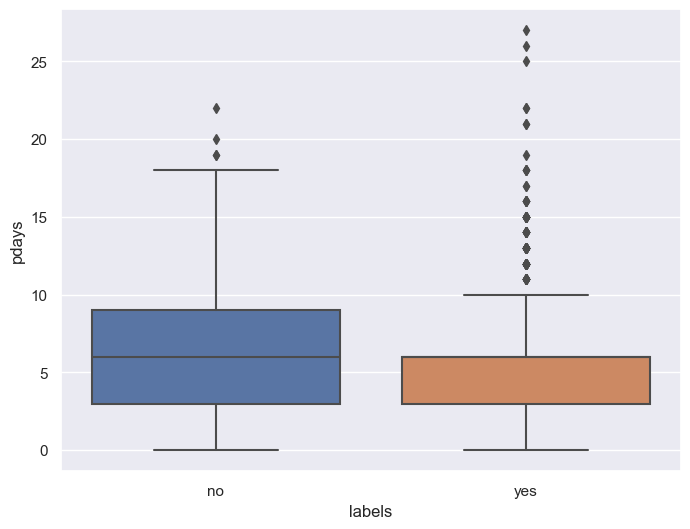

In [104]:
pday_wthout_mv = df.loc[df["pdays"] != 999, ["pdays", "labels"]]
sns.boxplot(data = pday_wthout_mv, y = "pdays", x = "labels")
print("Labels for not missing values")
yes_pdays999 = df.loc[df["pdays"] == 999,  "labels"]
yes_pdays999 = len(yes_pdays999[yes_pdays999 == "yes"]) / len(yes_pdays999)
print(f'yes = {round(yes_pdays999 * 100,2)}%; no={100-round(yes_pdays999 * 100,2)}%')

It may be useful to do not drop this label, because as we can see no contact strongly classify those values. Moreover, it also hard to call value $999$ missing value, because it describe a case, when client was not contacted previously, so it give us information. It may be good idea to build a new categorical feature, representing if clien was contacted previously.

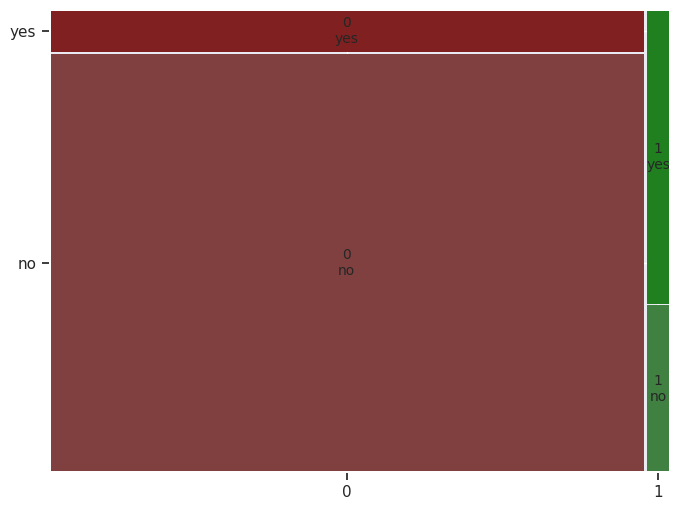

In [ ]:
df["wasContacted"] = df.pdays.apply(lambda x: 0 if x == 999 else 1)
round(pd.crosstab(df.wasContacted, df.labels) / len(df) * 100, 2)
mosaic(df, ["wasContacted", "labels"])
plt.show()


As we can see, there is different ratio for contacted and not contacted clients. This feature may be valueable in later predictions.

We know from data preprocessing, there are few columns which contains defined word for missing values - __"unknown"__ for columns: __type__, __martial__, __education__, __default__, __hausing__, __loan__ and __"nonexistent"__ word for column __poutcome__. Summarizing that there are no missing values implied by incomplete measurements. From the other side there are missing values because of not provided answers by respondents.

In [105]:
short_df = df[["job", "marital", "education", "default", "housing", "loan", "poutcome"]]

In [106]:
short_df.applymap(lambda short_df: 'unknown' in short_df).sum()

C:\Users\kubam\AppData\Local\Temp\ipykernel_16368\600032883.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  short_df.applymap(lambda short_df: 'unknown' in short_df).sum()


job           330
marital        80
education    1731
default      8597
housing       990
loan          990
poutcome        0
dtype: int64

In [107]:
short_df.applymap(lambda short_df: 'nonexistent' in short_df).sum()

C:\Users\kubam\AppData\Local\Temp\ipykernel_16368\1748991464.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  short_df.applymap(lambda short_df: 'nonexistent' in short_df).sum()


job              0
marital          0
education        0
default          0
housing          0
loan             0
poutcome     35563
dtype: int64

There are several ways to handle missing values. We would like to try the '5% method' which means - if particular column contains less than 5% of all rows with missing data then we can drop it but in other way, we will fill this particular column with randomly selected values from this column.

In [108]:
threshold = len(df) * 0.05
print(threshold)

2059.4


Here we can see, there is only __default__ column which has more 'unknown' variables than 5% of all data and __poutcome__ column with 'nonexistent' values more than 5% of all data. Regarding this method, we will drop values for: __job__, __marital__, __education__, __housing__, __loan__ columns.

In [109]:
mask = short_df == "unknown"
index_unknown = df[ (df['job'] == "unknown") | (df['marital'] == "unknown") | (df['education'] == "unknown") | (df['housing'] == "unknown") | (df['loan'] == "unknown") ].index
df.drop(index_unknown, inplace=True)
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,labels
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


As we can see, due to our method we obtain lower number of rows than before: 41188 -> 38245 rows. This is result of our '5% method'.

In [110]:
df[["job", "marital", "education", "default", "housing", "loan", "poutcome"]].applymap(lambda short_df: 'unknown' in short_df).sum()

C:\Users\kubam\AppData\Local\Temp\ipykernel_16368\1813655222.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[["job", "marital", "education", "default", "housing", "loan", "poutcome"]].applymap(lambda short_df: 'unknown' in short_df).sum()


job             0
marital         0
education       0
default      7757
housing         0
loan            0
poutcome        0
dtype: int64

Now we need to handle remain number of 'unknown' variables for __default__ column

In [111]:
df["default"].value_counts()

default
no         30485
unknown     7757
yes            3
Name: count, dtype: int64

There is significant difference between number of 'no' and 'yes' variables. From one hand, we could fill the 'unknown' values with certain probability. From the other side, number of 'yes' answers is almost equal zero, therefore we are going to drop that feature

In [112]:
df.drop(columns = ["default"], inplace = True)
qualitative_feats = list(qualitative_feats)
qualitative_feats.remove("default")

Analysing __poutcome__ we can see, that this feature has a lot of missing values. However we will do nothing with this fact, because later we can see, that that can be meaningful for classification.

In [ ]:
df["poutcome"].value_counts()

poutcome
nonexistent    35563
failure         4252
success         1373
Name: count, dtype: int64

## Handling outliers

At first, we are going to plot boxplots for all qualitative variables and scatterplots to check traits of their distributions and to find outliers.

In [59]:
quantitive_feats.remove("pdays")
quantitive_feats

['age',
 'duration',
 'campaign',
 'previous',
 'emp.var.rate',
 'cons.price.idx',
 'cons.conf.idx',
 'euribor3m',
 'nr.employed',
 'month',
 'day_of_week']

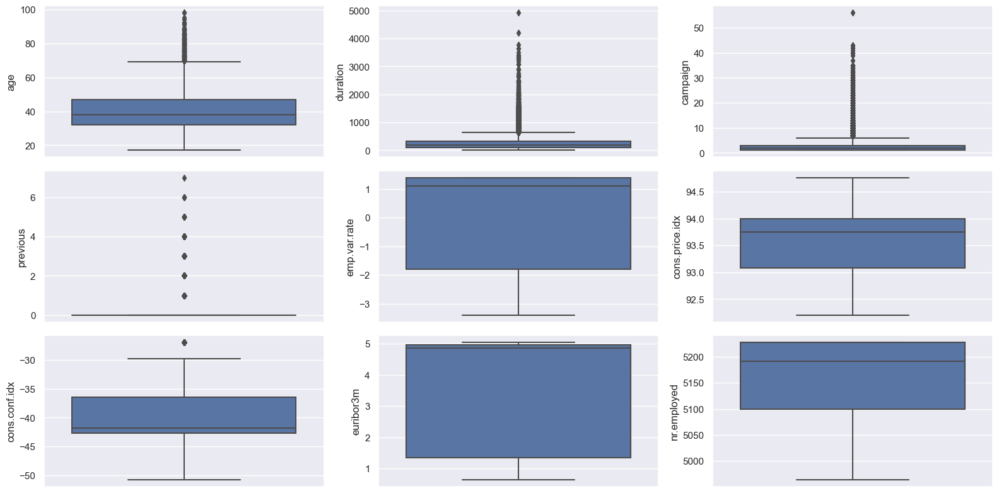

In [ ]:
fig = plt.figure(figsize=(16,8))

for i, label in enumerate(quantitive_feats[:-2]):
    ax = fig.add_subplot(3,3, i + 1)
    sns.boxplot(data = df, y = label)
plt.tight_layout()


From boxplots we can see that, features __age__, __duratin__ and __campaing__ probably have long tailed distributions. __previous__ has also atoms concentrating different values, and they should't be considered as outliers. Later we will disretize it, because from this boxplot it may be better idea to treat this variable as discrete. All features following __previous__ have tighter concentration of values. For some of them we can see skewness. __cons.price.idx__ and __cons.conf.idx__ look the most Gausian-like. From boxplots we assume there are outliers for __cons.conf.idx__ and __duration__.

In [113]:
IQR = lambda col: np.percentile(col, 75) - np.percentile(col, 25)
def outliers1d(dataset, col):
    col_name = col
    col = dataset[col]
    n = len(dataset)
    fig = plt.figure(figsize=(9,7))
    ax = fig.add_subplot(2,2,1)
    ax.hist(col)
    ax = fig.add_subplot(2,2,2)
    ax.boxplot(col)
    upper = col.quantile(0.75) + (1.5 * IQR(col)) #upper threshold
    lower = col.quantile(0.25) - (1.5 * IQR(col)) #lower threshold
    without_outliers = dataset[(dataset[col_name] > lower) & (dataset[col_name] < upper)]
    ax = fig.add_subplot(2,2,3)
    ax.hist(without_outliers[col_name])
    ax.set_xlabel(col.name)
    ax.set_ylabel("Number of observations")
    ax = fig.add_subplot(2,2,4)
    ax.boxplot(without_outliers[col_name])
    ax.set_ylabel(col.name)
    ax.set(xticklabels=[]) 
    ax.tick_params(bottom=False) 
    fig.suptitle("Outliers removed")
    fig.tight_layout()
    print(f'Removed rows: {n - len(without_outliers)} ({round((n - len(without_outliers)) / n * 100, 2)} %)')
    return without_outliers



In [114]:
#New variable for cleaned dataframe
df_cleaning1 = df.copy()


Removed rows: 409 (1.07 %)


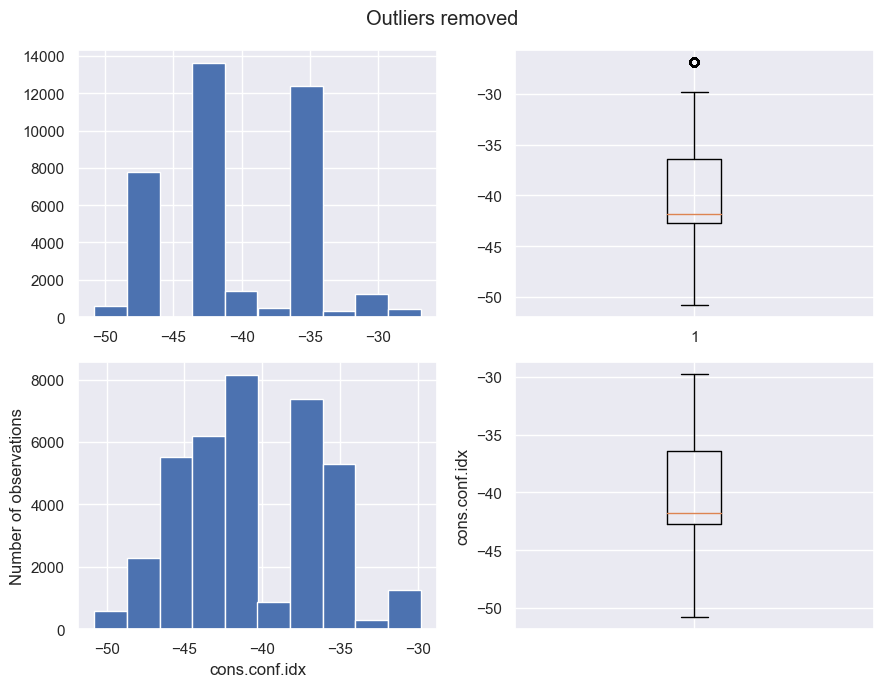

In [115]:
df_cleaning1 = outliers1d(df, "cons.conf.idx")


From one side we can see that values for this index are stacked, because index chanegs in time, but many clients were contacted when there were no reported change for indices. That is probably why values for indices have so many values cumulated in bunch of points. However, this value may still be considered as outlier from the view of changes for indices, and still, as we can see, only $1.07\%$ of observations was stacked in this position.

In [116]:
print(df_cleaning1.loc[df_cleaning1["duration"] > 4000, "duration"])
df_cleaning1 = df_cleaning1.loc[df_cleaning1["duration"] < 4000, :]

22192    4199
24091    4918
Name: duration, dtype: int64


For __duration__ we removed rows by hand, because of information delivered by boxplot, that there are observations enormous for this long tail. Now we are going to perform analysis for pairs of features.

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\kubam\AppData\Roaming\Python\Python311\sit

<Figure size 1600x800 with 0 Axes>

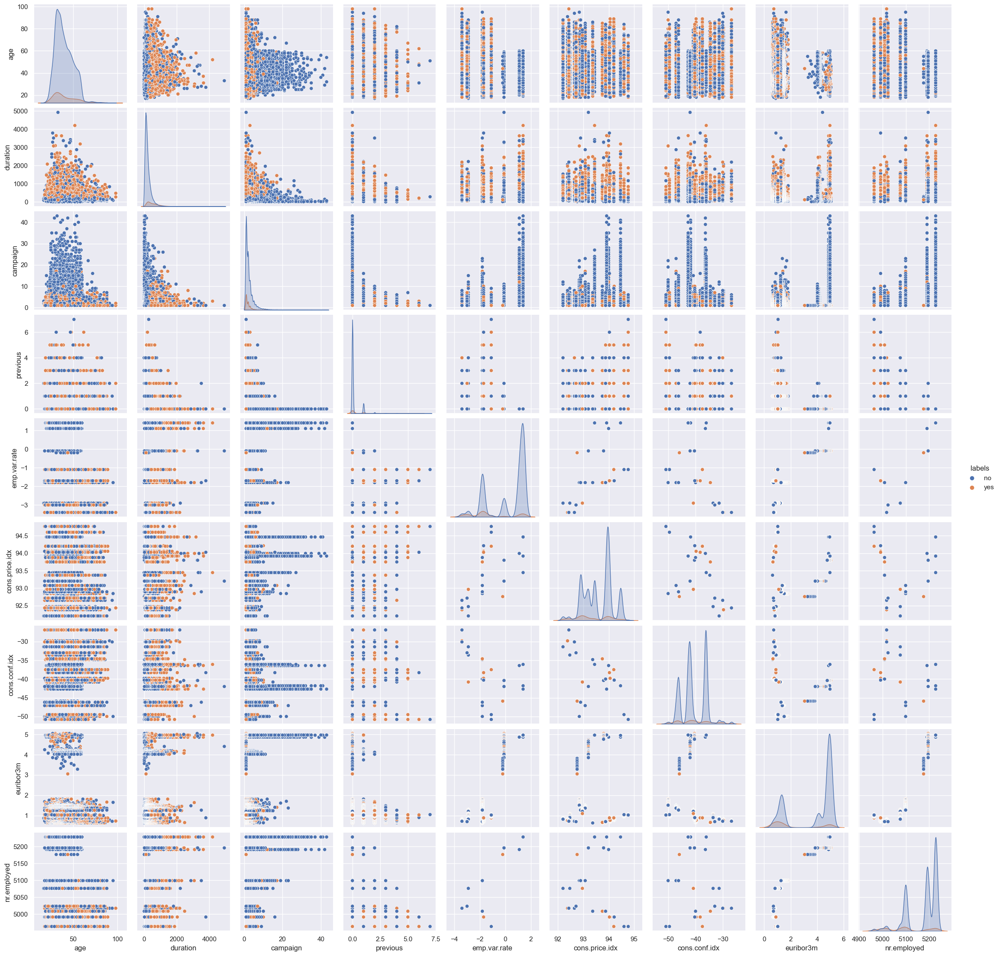

In [ ]:
fig = plt.figure(figsize=(16,8))

sns.pairplot(data = df[[*quantitive_feats[:-2], "labels"]], hue = "labels")

From scatter plots one can see that, there are not strong correlation between any pair of features. About linearity we cannot even dream. Eventually we can assume a kind of relation between __nr.employed__ and __euribor3m__ or __emp.var.rate__. From the other side, that the thesis about atoms of probability for __previous__ was correct. What is very unfortunate, that from kernel densities applied to continuous features, we can see that yes labels have slopes in the same places as no labels. It can be said, that the yes labels hide between numbers of observation, but do not manifest any special properties. Moreover, there are no feature pairs that show strong properties to classify observations to labels. 

We will going to find outliers with elliptic envelope method. It is unsupervised approach. We need to assume that the regular data come from a known distribution (e.g. data are Gaussian distributed). In this algorithm we search for central point and we draw ellipsoids around this point. Radii are measured using Mahalanobis distance. Contamination is defined as the proportion of outliers in the data set. The range of contamination is $(0, 0.5)$.

The scikit-learn provides an object covariance.EllipticEnvelope that fits a robust covariance estimate to the data, and thus fits an ellipse to the central data points, ignoring points outside the central mode.
For instance, assuming that the inlier data are Gaussian distributed, it will estimate the inlier location and covariance in a robust way (i.e. without being influenced by outliers). The Mahalanobis distances obtained from this estimate is used to derive a measure of outlyingness.

From the other side we applied Local Outler Factor, which base on concept of local density. Locality is given by k-nearest neighbors. It considers as outliers the samples that have a substantially lower density than their neighbors.

In [117]:
def outliers_plots(X):
    col1, col2 = X.columns
    fig = plt.figure(figsize=(21,7))
    ax = fig.add_subplot(1,3,1)
    sns.scatterplot(data = X, x = col1, y =col2)
    from sklearn.covariance import EmpiricalCovariance, MinCovDet

    # fit a MCD robust estimator to data
    robust_cov = MinCovDet().fit(X)
    # fit a MLE estimator to data
    emp_cov = EmpiricalCovariance().fit(X)
    print(
        "Estimated covariance matrix:\nMCD (Robust):\n{}\nMLE:\n{}".format(
            robust_cov.covariance_, emp_cov.covariance_
        )
    )
    import matplotlib.lines as mlines
    # Plot data set
    ax = fig.add_subplot(1,3,2)
    inlier_plot = ax.scatter(X.iloc[:,0], X.iloc[:,1], color="black", label="inliers")
    # ax.set_xlim(ax.get_xlim()[0], 100.0)
    ax.set_title("Mahalanobis distances of a contaminated data set")

    # Create meshgrid of feature 1 and feature 2 values
    xx, yy = np.meshgrid(
        np.linspace(plt.xlim()[0], plt.xlim()[1], 100),
        np.linspace(plt.ylim()[0], plt.ylim()[1], 100),
    )
    zz = np.c_[xx.ravel(), yy.ravel()]
    # Calculate the MLE based Mahalanobis distances of the meshgrid
    mahal_emp_cov = emp_cov.mahalanobis(zz)
    mahal_emp_cov = mahal_emp_cov.reshape(xx.shape)
    emp_cov_contour = plt.contour(
        xx, yy, np.sqrt(mahal_emp_cov), cmap=plt.cm.PuBu_r, linestyles="dashed"
    )
    # Calculate the MCD based Mahalanobis distances
    mahal_robust_cov = robust_cov.mahalanobis(zz)
    mahal_robust_cov = mahal_robust_cov.reshape(xx.shape)

    robust_contour = ax.contour(
        xx, yy, np.sqrt(mahal_robust_cov), cmap=plt.cm.YlOrBr_r, linestyles="dotted"
    )

    # Add legend
    ax.legend(
        [
            mlines.Line2D([], [], color="tab:blue", linestyle="dashed"),
            mlines.Line2D([], [], color="tab:orange", linestyle="dotted"),
            inlier_plot,
        ],
        ["MLE dist", "MCD dist", "observations"],
        loc="upper right",
        borderaxespad=0,
    )


    from sklearn.neighbors import LocalOutlierFactor
    from matplotlib.legend_handler import HandlerPathCollection

    clf = LocalOutlierFactor(n_neighbors= 4000, contamination=0.3)
    y_pred = clf.fit_predict(X)
    X_scores = clf.negative_outlier_factor_


    def update_legend_marker_size(handle, orig):
        "Customize size of the legend marker"
        handle.update_from(orig)
        handle.set_sizes([20])

    
    ax = fig.add_subplot(1,3,3)
    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], color="k", s=3.0, label="Data points")
    # plot circles with radius proportional to the outlier scores
    radius = (X_scores.max() - X_scores) / (X_scores.max() - X_scores.min())
    scatter = plt.scatter(
        X.iloc[:, 0],
        X.iloc[:, 1],
        s=1000 * radius,
        edgecolors="r",
        facecolors="none",
        label="Outlier scores",
    )
    plt.axis("tight")
    # plt.xlabel("prediction errors: %d" % (n_errors))
    plt.legend(
        handler_map={scatter: HandlerPathCollection(update_func=update_legend_marker_size)}
    )
    plt.title("Local Outlier Factor (LOF)")
    plt.show()

Estimated covariance matrix:
MCD (Robust):
[[ 2.57089059e-03 -4.41759835e-03]
 [-4.41759835e-03  8.62728368e+01]]
MLE:
[[  2.94895512   0.37727717]
 [  0.37727717 106.22180473]]


C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but EmpiricalCovariance was fitted with feature names
  warnings.warn(
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinCovDet was fitted with feature names
  warnings.warn(


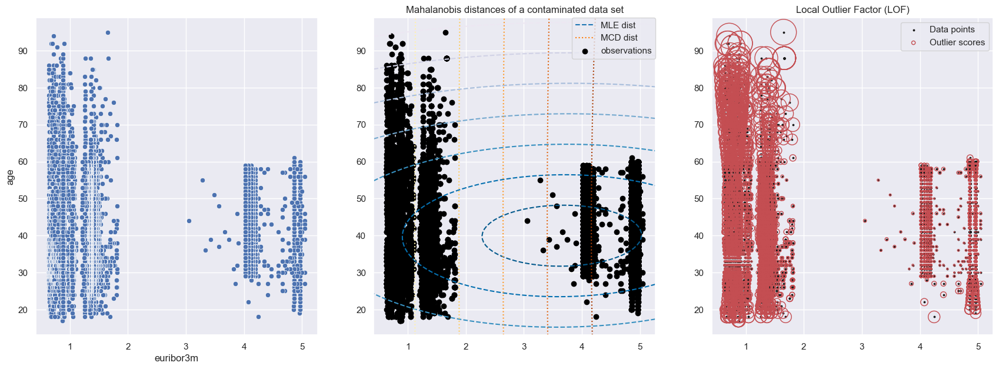

In [ ]:
outliers_plots(df_cleaning1[["euribor3m", "age"]])

Estimated covariance matrix:
MCD (Robust):
[[0.00262482 0.00516965]
 [0.00516965 2.17986392]]
MLE:
[[2.94895512 0.62290761]
 [0.62290761 7.73749593]]


C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but EmpiricalCovariance was fitted with feature names
  warnings.warn(
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MinCovDet was fitted with feature names
  warnings.warn(


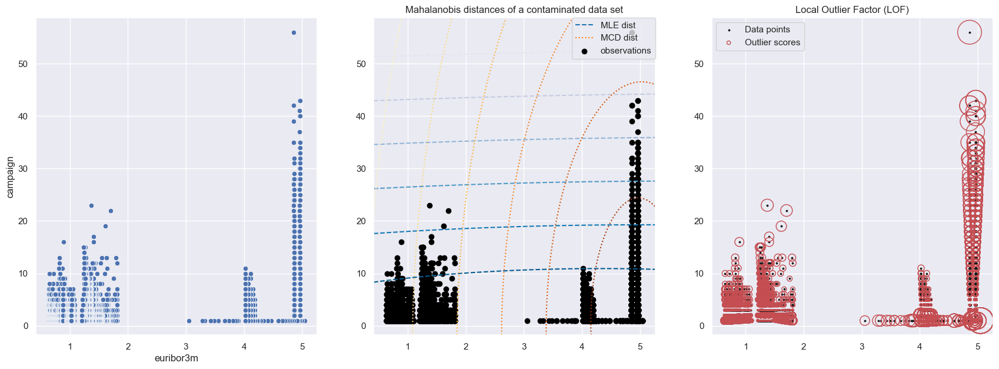

In [ ]:
outliers_plots(df_cleaning1[["euribor3m", "campaign"]])


Estimated covariance matrix:
MCD (Robust):
[[10869.15868501   -49.11517358]
 [  -49.11517358    85.60987724]]
MLE:
[[6.64562180e+04 5.12140368e+00]
 [5.12140368e+00 1.03468643e+02]]


/home/zive_bewise/.local/envs/PyML/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but EmpiricalCovariance was fitted with feature names
  warnings.warn(
/home/zive_bewise/.local/envs/PyML/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinCovDet was fitted with feature names
  warnings.warn(


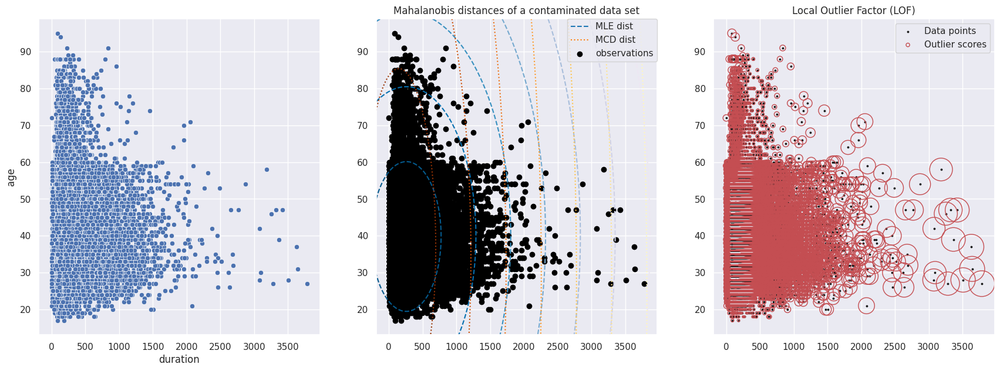

In [ ]:
outliers_plots(df_cleaning1[["duration", "age"]])


Estimated covariance matrix:
MCD (Robust):
[[ 0.53609362 -0.31933108]
 [-0.31933108 84.81864896]]
MLE:
[[  7.72249695   0.22066194]
 [  0.22066194 103.46864255]]


/home/zive_bewise/.local/envs/PyML/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but EmpiricalCovariance was fitted with feature names
  warnings.warn(
/home/zive_bewise/.local/envs/PyML/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinCovDet was fitted with feature names
  warnings.warn(


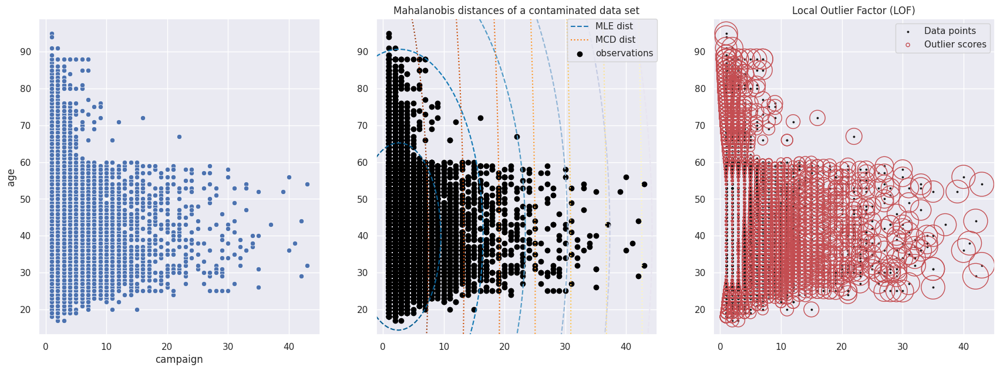

In [ ]:
outliers_plots(df_cleaning1[["campaign", "age"]])


As we can see, provided methods from assumptions can be usefull for data, that follow gaussian-like distribution, therefore they are more helpful for well concentrated pairs like __campaing__-__age__ or __duration__-__age__, but for presented pairs with __euribor3m__ looks useless. For Elliptic Envelope method MLE estimator more useful ellipsoids, however, it may be caused by the way in which data concentrate.

From the other side for features which may follow some function $y=f(x)$ we applied regression. Because, as we said previously, there is no linear relation, we tried to use different polynomials and  also splines delivered during labs.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from sklearn.linear_model import Ridge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures, SplineTransformer

In [ ]:
def regression(df, degs : list, **kwargsspline):
    X = df.iloc[:, 0]
    Y = df.iloc[:, 1]
    XX = X.values[:, np.newaxis]
    train = df.sample( n =  int(len(X) * 0.8))
    x_train = train.iloc[:, 0]
    y_train = train.iloc[:, 1]
    x_train = x_train.values[:, np.newaxis]
    fig, ax = plt.subplots()
    ax.set_prop_cycle(
        color=["black", "teal", "yellowgreen", "gold", "darkorange", "tomato"]
    )
    # ax.plot(X, Y, linewidth=2, label="ground truth")
    ax.scatter(X, Y, label="real values")

    # polynomial features
    for degree in degs or []:
        model = make_pipeline(PolynomialFeatures(degree), Ridge(alpha=1e-3))
        model.fit(x_train, y_train)
        y_plot = model.predict(XX)
        ax.plot(X, y_plot, label=f"degree {degree}")

    # B-spline with: n_knots + degree - 1 =  basis functions
    model = make_pipeline(SplineTransformer(**kwargsspline), Ridge(alpha=1e-3))
    model.fit(x_train, y_train)
    y_plot = model.predict(XX)
    ax.plot(X, y_plot, label="B-spline")
    ax.legend(loc="lower right")
    plt.show()

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=7.89285e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=1.69155e-24): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


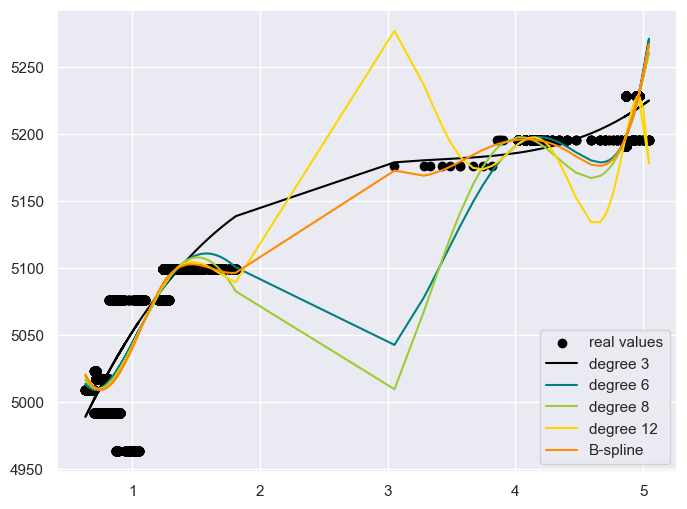

In [ ]:
regression(
    df_cleaning1[["euribor3m", "nr.employed"]],
    [3, 6,8,12],
    n_knots = 8,
    degree = 3)

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=5.78685e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=9.76773e-28): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


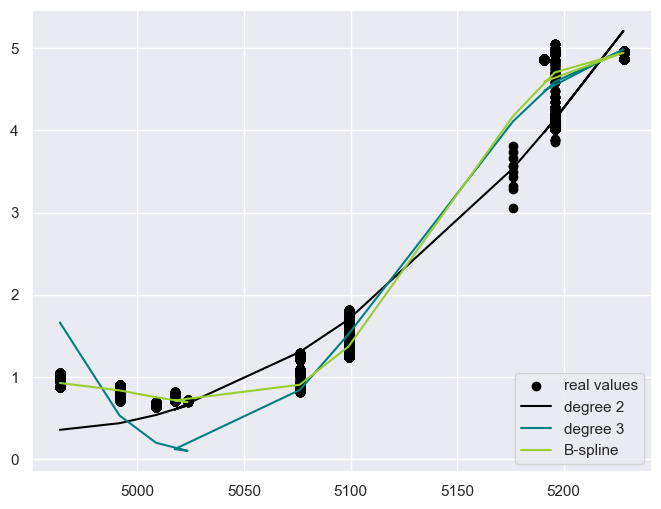

In [ ]:
regression(
    df_cleaning1[["nr.employed", "euribor3m"]],
    [2, 3],
    n_knots = 3,
    degree = 3)

For changed axis, fitted functions look pretty elegant and we do not consider any observation as outlier.

### Scaling and transforming features

Now we are going to normalize data and then apply transforms, in order to make features distributions looking more normal. Because there are not significant number of outliers, therefore we are going to use MinMax transform. We will apply some transform normalizing data after scaling, because it provide better results, in making data more Gaussian-like.

In [118]:
scaler = MinMaxScaler()
scaled_feats = scaler.fit_transform(df_cleaning1[quantitive_feats[:-2]])
df_quantitives_normed = pd.DataFrame(scaled_feats)
df_quantitives_normed = df_quantitives_normed.rename( columns = {x:y for (x,y) in zip(range(len(quantitive_feats[:-2])), quantitive_feats[:-2])})
df_quantitives_normed["labels"] = labels
df_quantitives_normed.head(3)

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,labels
0,0.500000,0.068956,0.0,1.0,0.0,0.9375,0.698753,0.685714,0.957379,0.859735,no
1,0.512821,0.039366,0.0,1.0,0.0,0.9375,0.698753,0.685714,0.957379,0.859735,no
2,0.256410,0.059709,0.0,1.0,0.0,0.9375,0.698753,0.685714,0.957379,0.859735,no


/home/zive_bewise/.local/envs/PyML/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/zive_bewise/.local/envs/PyML/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/zive_bewise/.local/envs/PyML/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/zive_bewise/.local/envs/PyML/lib/python

<Figure size 1600x800 with 0 Axes>

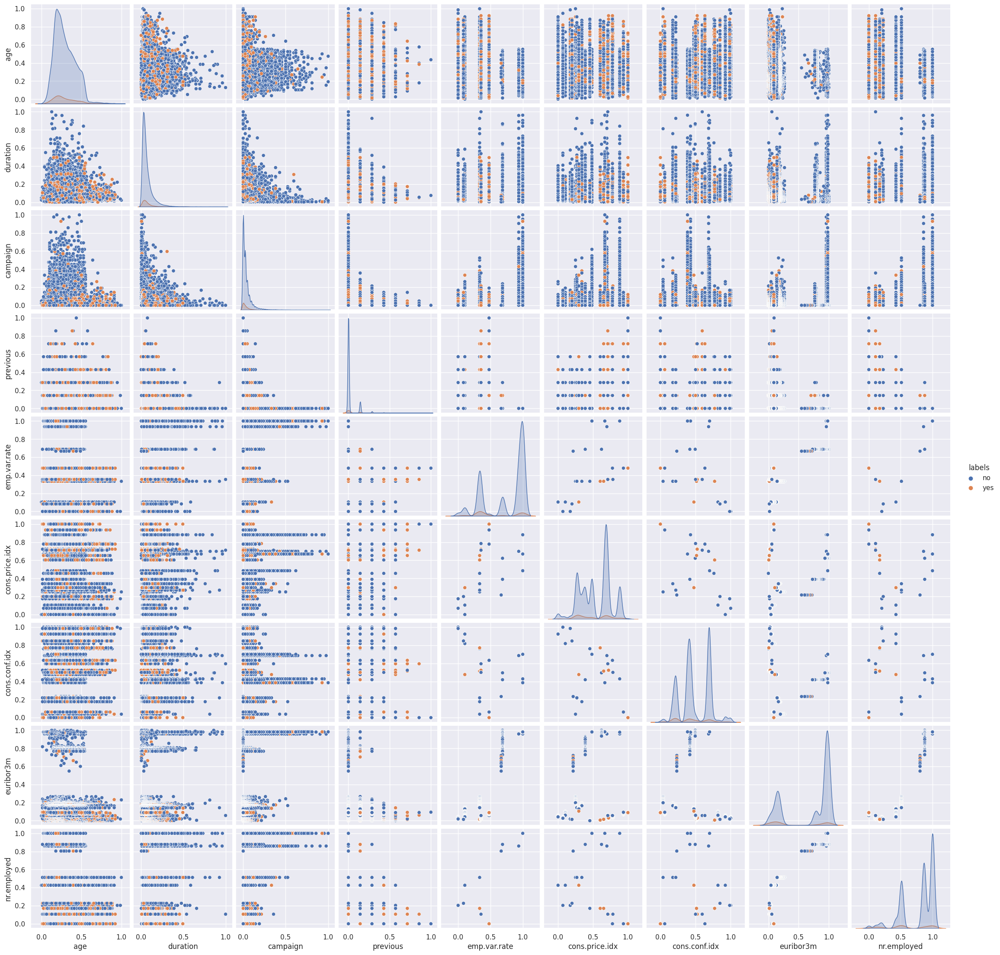

In [ ]:
fig = plt.figure(figsize=(16,8))

sns.pairplot(data = df_quantitives_normed, hue = "labels")

In [119]:
from scipy import stats
from typing import Callable, List, Tuple

def show_transforms(col, transforms : List[Callable], figsize : Tuple[float, float] = (9,7), transforms_names = []):
    if transforms_names == []:
        transforms_names = [""] * len(transforms)
    fig = plt.figure(figsize = figsize)
    n = len(transforms) + 1
    ax = fig.add_subplot(2, n, 1)
    ax.set_title("Original")
    ax.hist(col)
    ax = fig.add_subplot(2, n, 1 + n)
    sns.boxplot(y = col)
    # print(f'Outliers:{col[(col.quantile(0.75) + 1.5 * IQR(col) > col) & (col.quantile(0.25) - 1.5 * IQR(col) < col)]}')
    for i, fun in enumerate(transforms):
        transformed = fun(col)
        # transformed = col.apply(fun)
        ax = fig.add_subplot(2, n, i + 2)
        ax.hist(transformed)
        ax.set_title(transforms_names[i])
        ax = fig.add_subplot(2, n, i + 2 + n)
        sns.boxplot(y = transformed)
    plt.tight_layout()


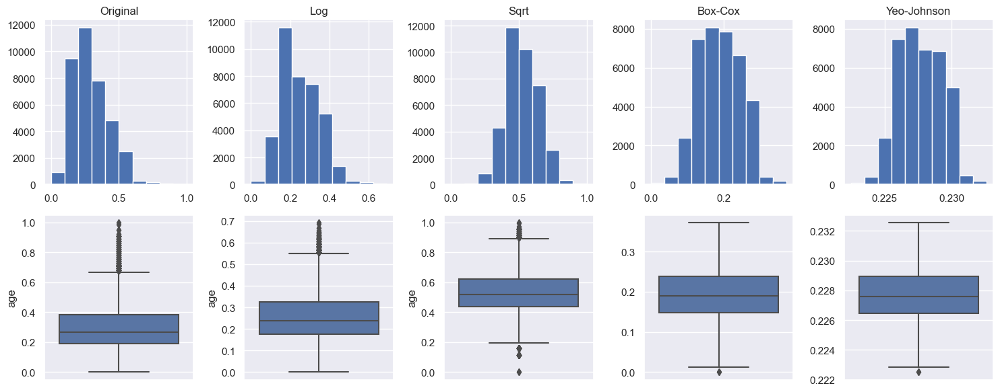

In [ ]:
show_transforms(
    df_quantitives_normed["age"],
    [
        lambda x: np.log(x + 1),
        lambda x: np.sqrt(x),
        lambda x: stats.boxcox(x + 1)[0],
        lambda x: stats.yeojohnson(x + 1)[0]
    ],
    transforms_names = ["Log", "Sqrt", "Box-Cox", "Yeo-Johnson"],
    figsize = (15,6)
    )

As we can see, Boc-Cox transform provide the most Gaussian-like looking data. Square root not looks bad, but it is more leptocurtic. It generates one outlier, but we do not delete it, because we have seen in original data, that it was correct.

Duration probably has also long tailed distribuition, so removing values higher than  $q_{0.75}+ 1.5IQR$ does not seem resonable. We would like to see if we can provide those data in more normal form.

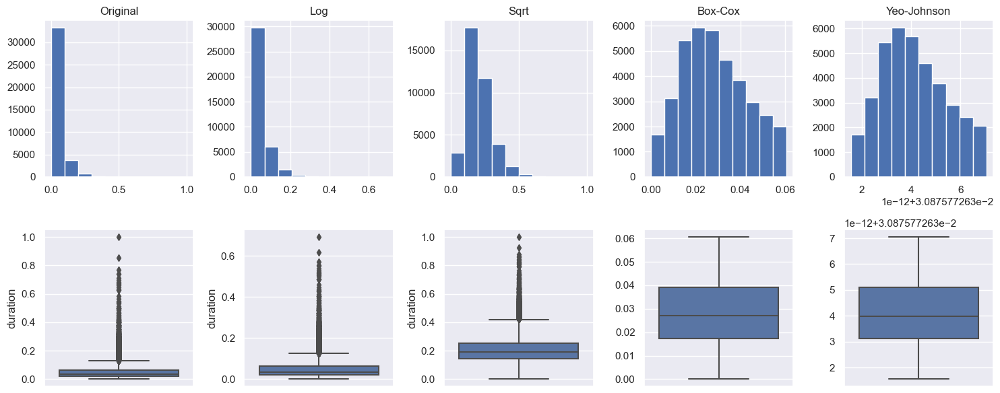

In [ ]:
show_transforms(
    # df["duration"],
    df_quantitives_normed["duration"],
    [
        lambda x: np.log(x + 1),
        lambda x: np.sqrt(x),
        lambda x: stats.boxcox(x + 1)[0],
        lambda x: stats.yeojohnson(x + 1)[0]
    ],
    transforms_names = ["Log", "Sqrt", "Box-Cox", "Yeo-Johnson"],
    figsize = (15,6)
    )

Because of $0$ values in data, we add 1 in log and Box-Cox  transforms. It looks like Box-Cox transform removed skewness from data, however in original data we are able to see pattern: yes labels usually appeared in long tail, therefore we will keep original version.

Last feature which manifest long tail is campaign.

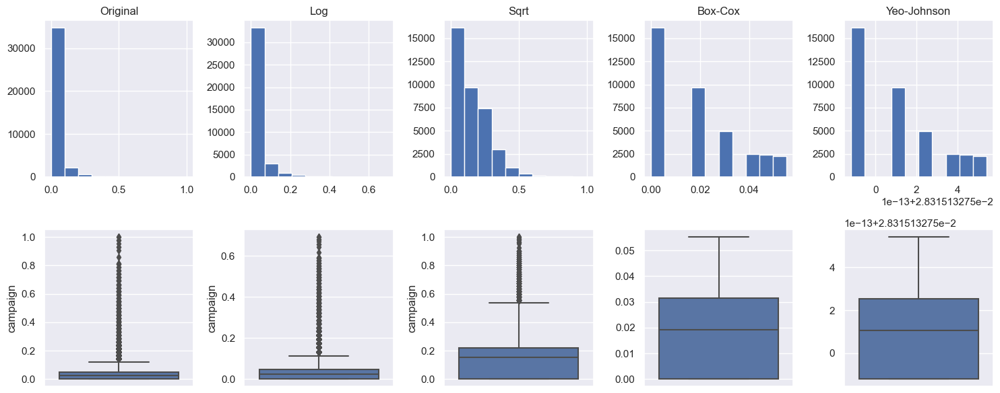

In [ ]:
show_transforms(
    df_quantitives_normed["campaign"],
    [
        lambda x: np.log(x + 1),
        lambda x: np.sqrt(x),
        lambda x: stats.boxcox(x + 1)[0],
        lambda x: stats.yeojohnson(x + 1)[0]
    ],
    transforms_names = ["Log", "Sqrt", "Box-Cox", "Yeo-Johnson"],
    figsize = (15,6)
    )

<Axes: xlabel='index'>

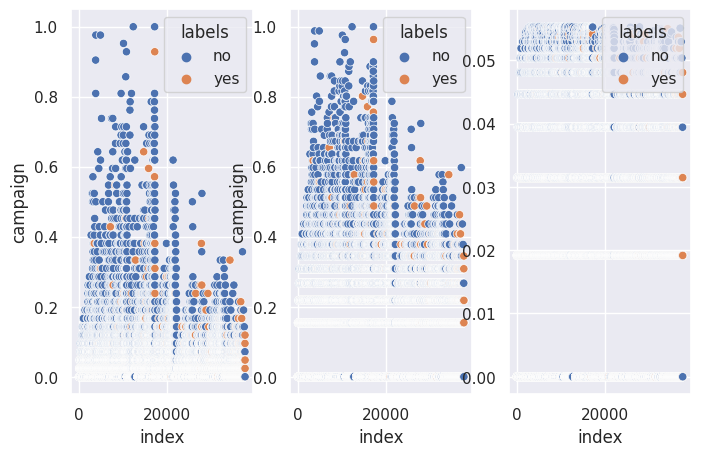

In [ ]:
fig = plt.figure(figsize=(8,5))
ax = fig.add_subplot(1,3,1)
# sns.boxplot(data = df_quantitives_normed, y = "campaign", x = "labels")
sns.scatterplot(data = df_quantitives_normed.reset_index(), y = "campaign", x = "index", hue = "labels")
ax = fig.add_subplot(1,3,2)
sns.scatterplot(data = df_quantitives_normed.reset_index(), y = np.sqrt(df_quantitives_normed["campaign"]), x = "index", hue = "labels")
ax = fig.add_subplot(1,3,3)
sns.scatterplot(data = df_quantitives_normed.reset_index(), y = stats.boxcox(df_quantitives_normed["campaign"] + 1)[0], x = "index", hue = "labels")

We can see that Box-Cox transform and Yeo-Johnson minimized differences in bins, therefore. From scatter plot we can also verify this. Less effective here was square root. This transform provided data looking more exponentially. We are going to use Box-Cox transform, because delivered data can be discretized in very natural way.

In [120]:
def merge_dfs(df1, df2):
    buff = df1.copy()
    buff = buff.reset_index()
    for col in df2.columns:
        buff[col] = pd.Series(df2[col])
    return buff.drop(columns = ['index'])
df_cleaning2 = merge_dfs(df_cleaning1, df_quantitives_normed)

In [121]:
#Transforms applied
df_cleaning2["age"] = stats.boxcox(df_cleaning2["age"] + 1)[0]
# #Duration with Box-Cox
df_cleaning2["duration2"] = stats.boxcox(df_cleaning2["duration"] + 1)[0]
df_cleaning2["campaign"] = stats.boxcox(df_cleaning2["campaign"] + 1)[0]

/home/zive_bewise/.local/envs/PyML/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/zive_bewise/.local/envs/PyML/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/zive_bewise/.local/envs/PyML/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/zive_bewise/.local/envs/PyML/lib/python

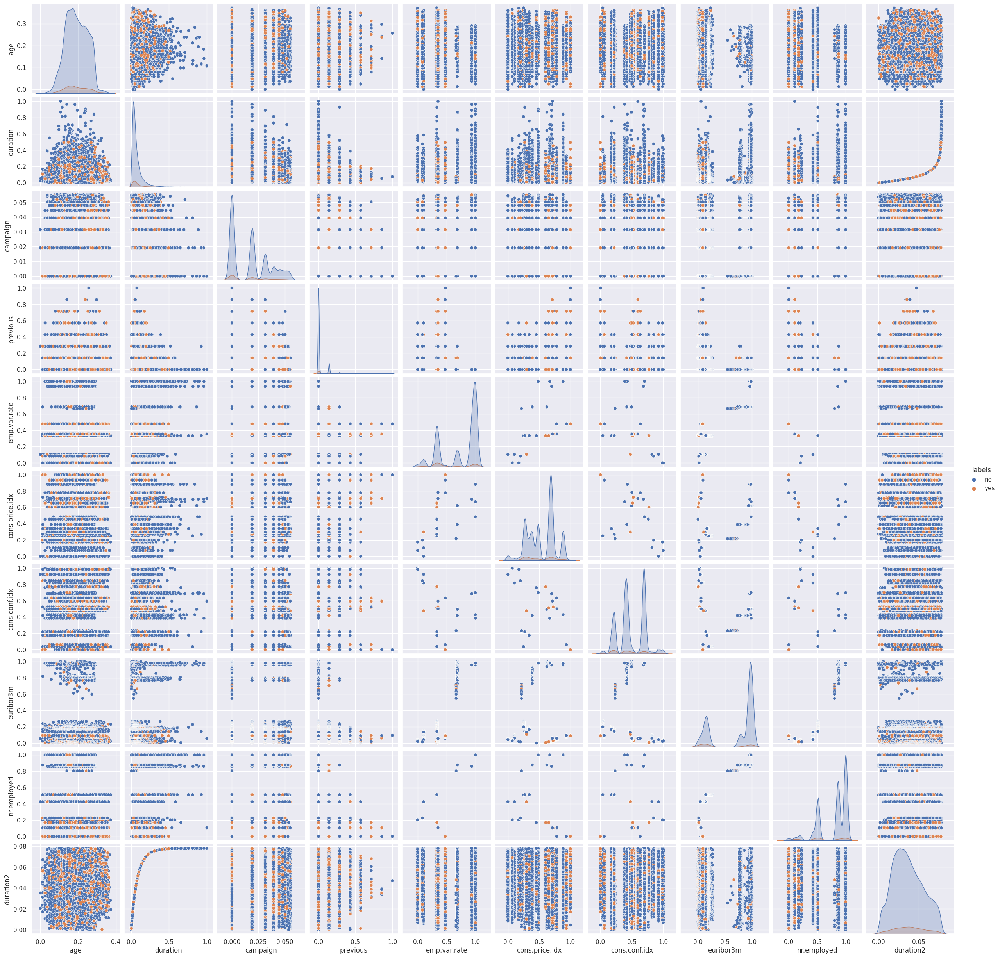

In [ ]:
sns.pairplot(data = df_cleaning2[[*quantitive_feats[:-2], "duration2", "labels"]], hue = "labels")

As we can see, tranformations do not improve classification task so far, however now features have greater normality traits in dataset.

## Correlations in quantitative variables and quantitative and qualitative variables

In this step we would like to verify potential relations between different groups of features. It may provide us useful way to determine which features may be less or more useful in classification task.

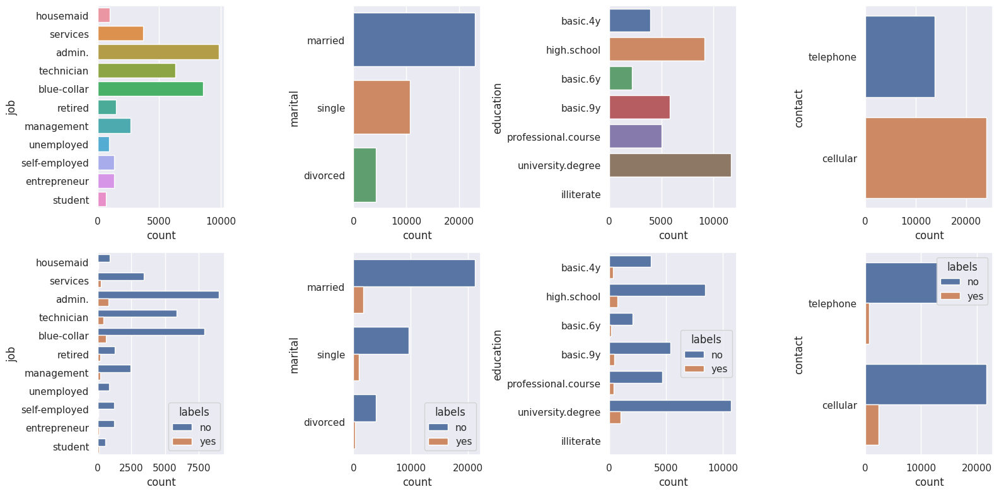

In [ ]:

fig = plt.figure(figsize=(16,8))
ax = fig.add_subplot(2,4,1)
sns.countplot(data = df_cleaning2, y = "job" )

ax = fig.add_subplot(2,4,2)
sns.countplot(data = df_cleaning2, y = "marital" )

ax = fig.add_subplot(2,4,3)
sns.countplot(data = df_cleaning2, y = "education" )

ax = fig.add_subplot(2,4,4)
sns.countplot(data = df_cleaning2, y = "contact" )

ax = fig.add_subplot(2,4,5)
sns.countplot(data = df_cleaning2, y = "job" , hue = "labels")

ax = fig.add_subplot(2,4,6)
sns.countplot(data = df_cleaning2, y = "marital", hue = "labels" )

ax = fig.add_subplot(2,4,7)
sns.countplot(data = df_cleaning2, y = "education", hue = "labels" )

ax = fig.add_subplot(2,4,8)
sns.countplot(data = df_cleaning2, y = "contact", hue = "labels" )

fig.tight_layout()

In [122]:
# for col in df_cleaning2[[*qualitative_feats, "labels"]]:
def compute_percentages(df, labels : str):
    for col in df:
        if col == labels: 
            continue    
        print(f"Percentages for {col}:")
        ratio = round(df.groupby([col, labels]).size() / df.groupby(col).size() * 100, 2)
        print(ratio)
        print()
compute_percentages(df_cleaning2[[*qualitative_feats, "labels"]], "labels")

Percentages for job:
job            labels
admin.         no        91.45
               yes        8.55
blue-collar    no        92.80
               yes        7.20
entrepreneur   no        92.98
               yes        7.02
housemaid      no        92.02
               yes        7.98
management     no        91.89
               yes        8.11
retired        no        86.95
               yes       13.05
self-employed  no        93.28
               yes        6.72
services       no        92.81
               yes        7.19
student        no        84.43
               yes       15.57
technician     no        93.07
               yes        6.93
unemployed     no        92.26
               yes        7.74
dtype: float64

Percentages for marital:
marital   labels
divorced  no        92.79
          yes        7.21
married   no        92.31
          yes        7.69
single    no        91.17
          yes        8.83
dtype: float64

Percentages for education:
education         

As we can see, there are preferences in contacts, in each categories presented on the plot. There is no feature with uniform distribution. There were often contacted person with greater academic education, married people and those with full-time job. As we can see from plots and also from calculating a percent of labels in each class for each feature, the ratio are mostly the same, especially in __job__, __marital__, __education__, __housing__ and __loan__. Now, we are going to analyze strongly imbalanced classes.

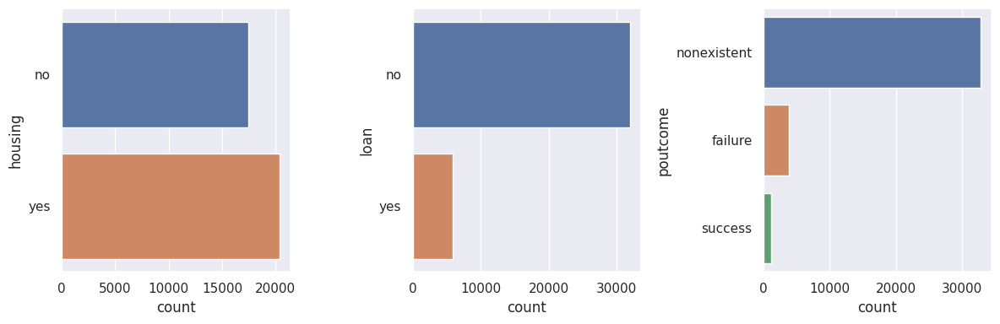

In [ ]:
fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(1,3,1)
sns.countplot(data = df_cleaning2, y = "housing" )

ax = fig.add_subplot(1,3,2)
sns.countplot(data = df_cleaning2, y = "loan" )

ax = fig.add_subplot(1,3,3)
sns.countplot(data = df_cleaning2, y = "poutcome" )

fig.tight_layout()



In [ ]:
round(pd.crosstab(df_cleaning2.loan, df_cleaning2.labels) / len(df_cleaning2) * 100, 2)

labels,no,yes
loan,,
no,77.72,6.66
yes,14.32,1.30


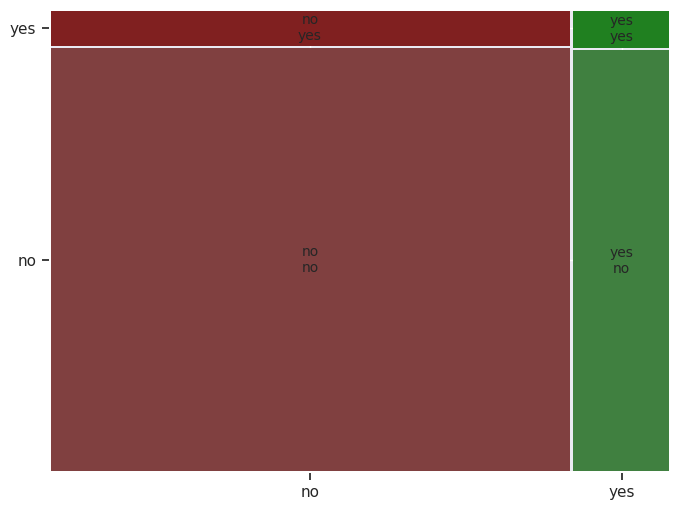

In [ ]:
mosaic(df_cleaning2, ["loan", "labels"])
plt.show()

Loan class is strongly imbalanced and moreover, mosaic plot do not show significant influence of this class on the client decision. Probably this feature will not be especially relevant in analysis.

labels          no   yes
poutcome                
failure       8.79  1.35
nonexistent  80.82  5.91
success       2.42  0.70


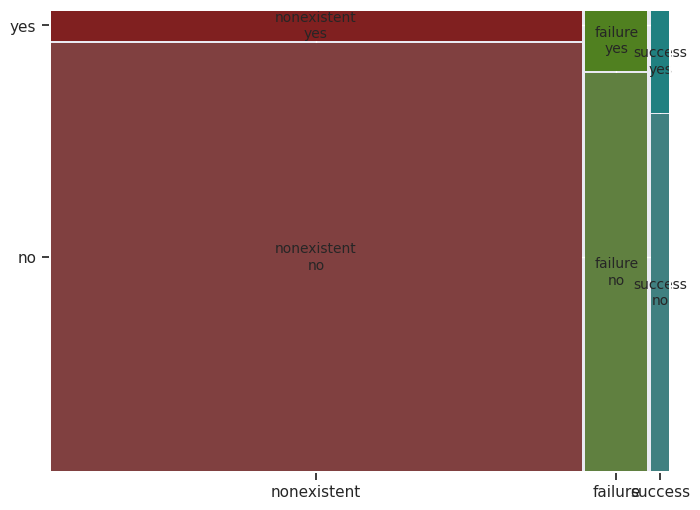

In [ ]:
print(round(pd.crosstab(df_cleaning2.poutcome, df_cleaning2.labels) / len(df_cleaning2) * 100, 2))
mosaic(df_cleaning2, ["poutcome", "labels"])
plt.show()

Situation with poutcome is much more complex. Missing values are merely total representation of data. Dataset has about 85% missing values in this category. However, we can see from mosaic plot that clients whos were satysfied with outcome of previous campaign much often decided for this offer. 

labels      no   yes
housing             
no       42.69  3.51
yes      49.35  4.45


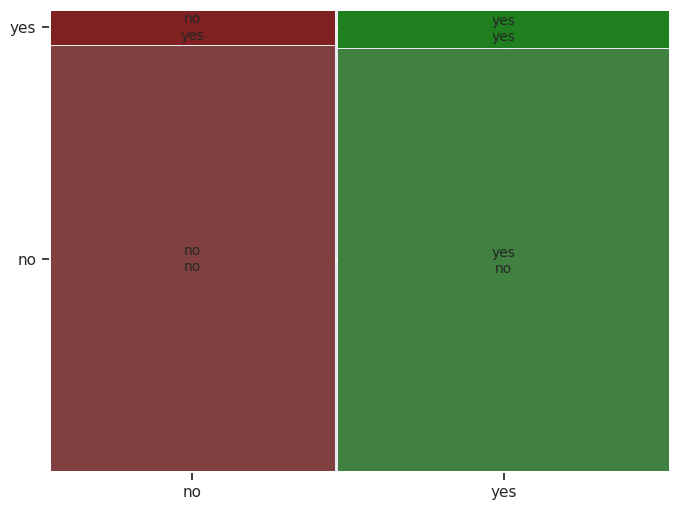

In [ ]:
print(round(pd.crosstab(df_cleaning2.housing, df_cleaning2.labels) / len(df_cleaning2) * 100, 2))
mosaic(df_cleaning2, ["housing", "labels"])
plt.show()

For housuing, labels conserved ratio in both groups therefore it is rather not efficient feature for predictions.

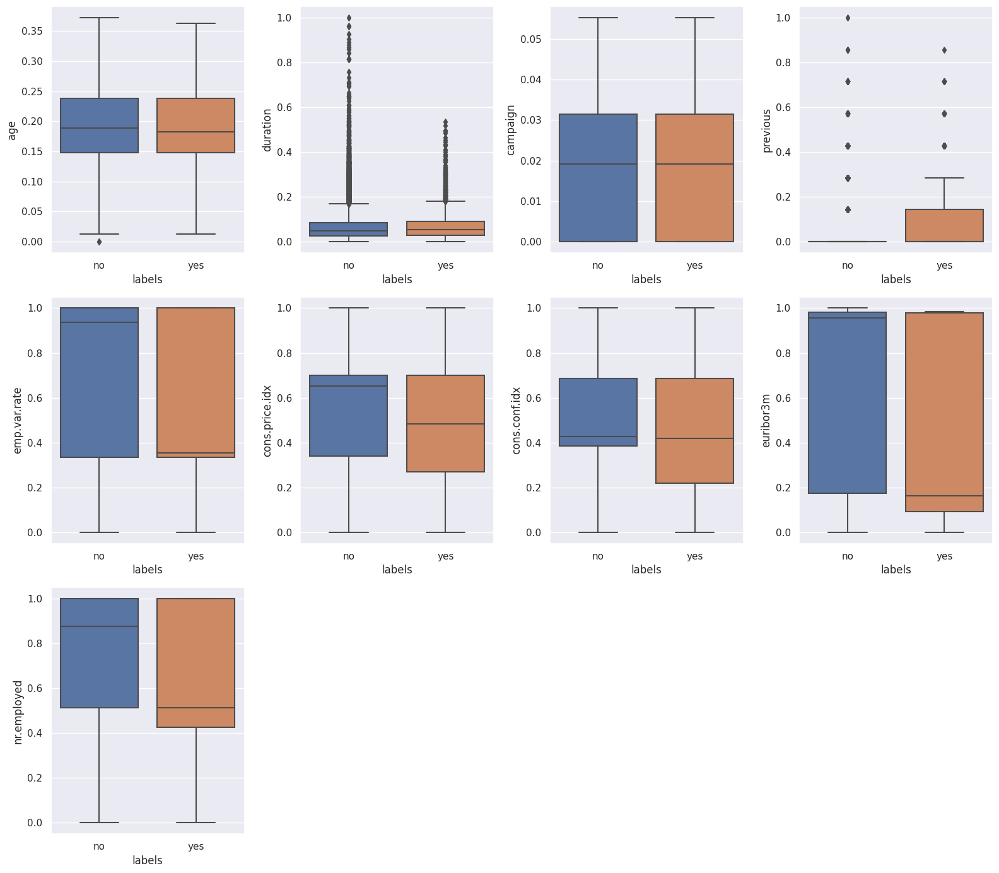

In [ ]:
sns.set(rc={'figure.figsize':(16,14)})
fig = plt.figure()
for idx, lab in enumerate(quantitive_feats[:-2]):
    ax = fig.add_subplot(3,4, idx + 1)
    sns.boxplot(data = df_cleaning2, y = lab, x = "labels")
fig.tight_layout()


sns.set(rc={'figure.figsize':(8,6)})
#Generate also for scaled features

As we can see for quantitative features, there are not attribute strongly split by labels. However __emp.var.rate__, __cons.price.idx__, __euribor3m__ and __nr.employed__ have different menas in both groups. This information can b useful.

### Relations between quantitative and qualitative features

Text(0.5, 1.0, 'age~marital (not normalised)')

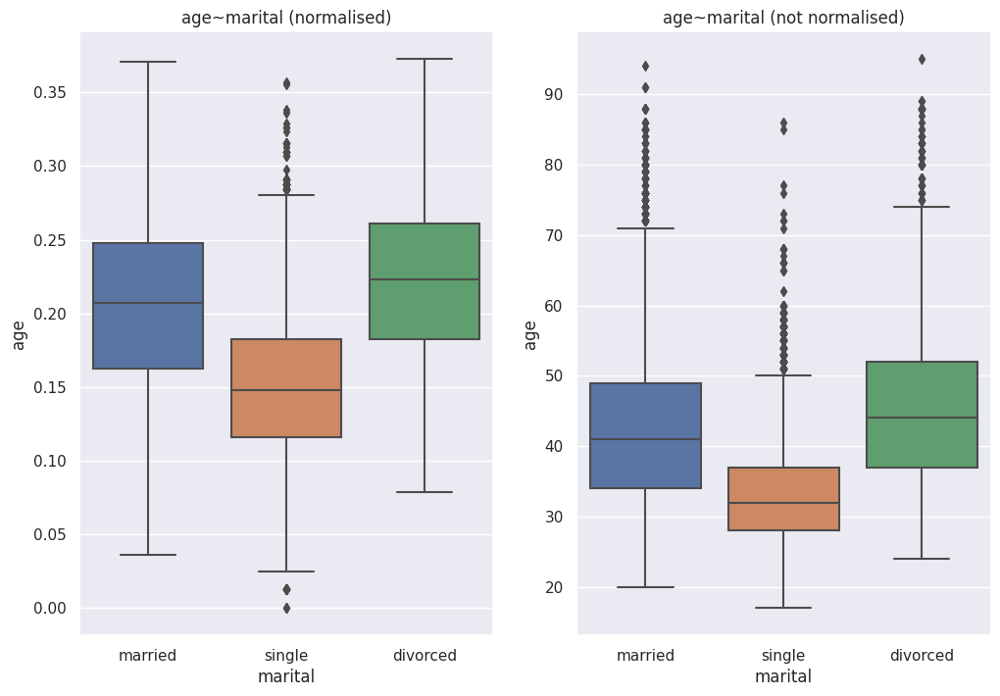

In [ ]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(1,2, 1)
sns.boxplot(data = df_cleaning2, y = "age", x = "marital")
ax.set_title("age~marital (normalised)")
ax = fig.add_subplot(1,2, 2)
sns.boxplot(data = df_cleaning1, y = "age", x = "marital")
ax.set_title("age~marital (not normalised)")

For clients who are single median of the age is slightly lower than for those who are married or divorced. Scaling does not disrupt this order. However this difference is not impressive and do not show strong correlation of variables.

[Text(0.5, 1.0, 'Dependences between marital status and job type'),
 Text(0.5, 0, 'marital status'),
 Text(0, 0.5, 'number of observations')]

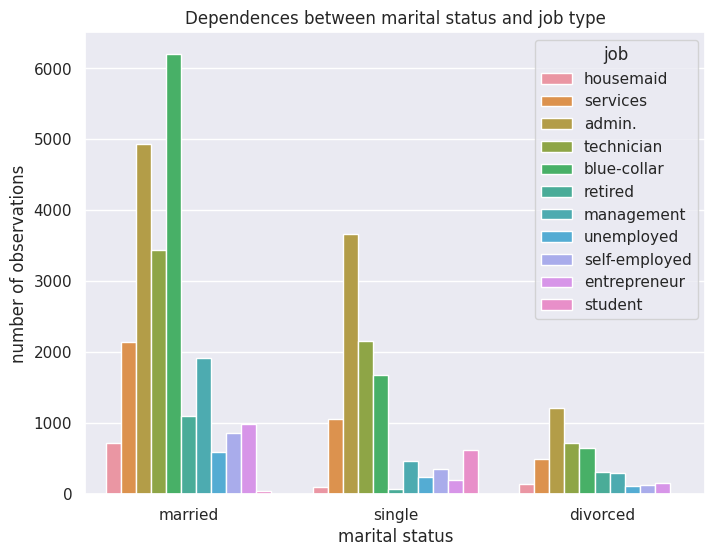

In [ ]:
sns.countplot(
    data = df_cleaning2,
    x='marital',hue='job').set(title="Dependences between marital status and job type", xlabel='marital status', ylabel='number of observations')

As we can see in married group, there are meaningful representation of blue-collar. For divorced number differences in groups are the smallest.

Text(0.5, 1.0, 'age~education (not normalised)')

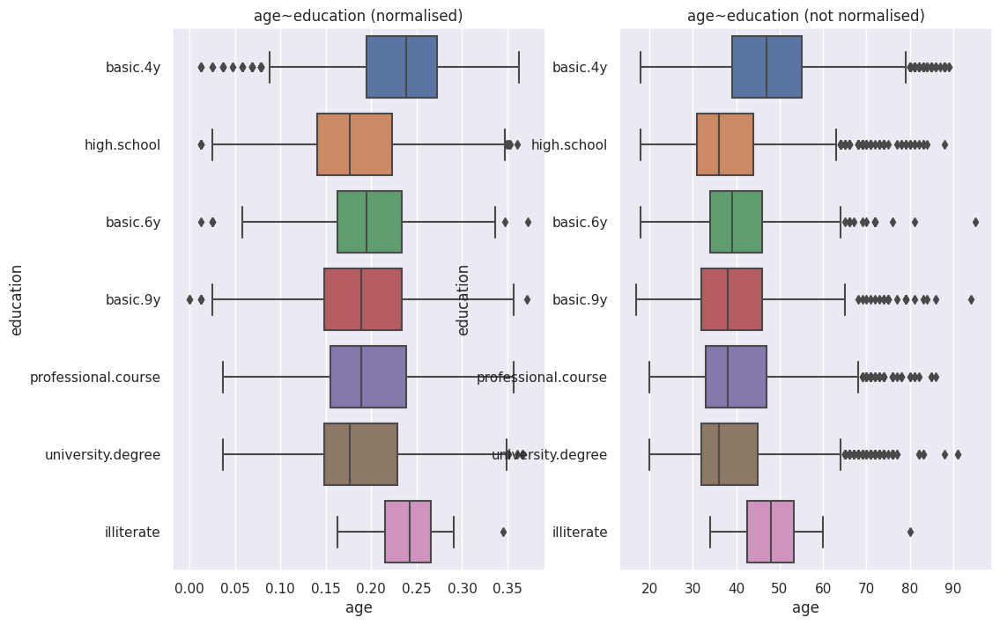

In [ ]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(1,2, 1)
sns.boxplot(data = df_cleaning2, x = "age", y = "education")
ax.set_title("age~education (normalised)")
ax = fig.add_subplot(1,2, 2)
sns.boxplot(data = df_cleaning1, x = "age", y = "education")
ax.set_title("age~education (not normalised)")

Text(0.5, 1.0, 'age~job (not normalised)')

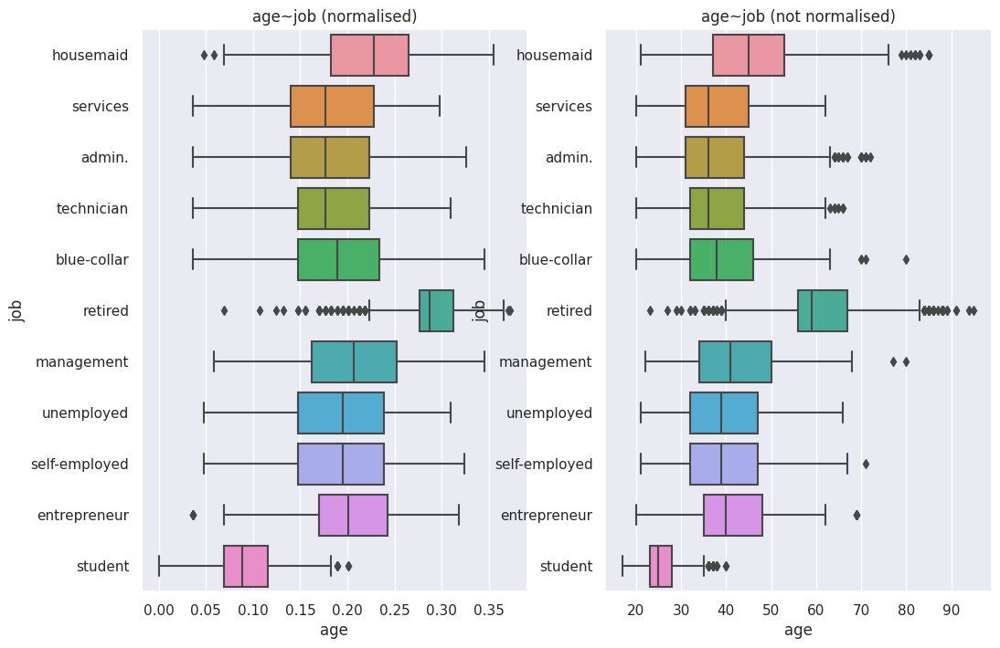

In [ ]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(1,2, 1)
sns.boxplot(data = df_cleaning2, x = "age", y = "job")
ax.set_title("age~job (normalised)")
ax = fig.add_subplot(1,2, 2)
sns.boxplot(data = df_cleaning1, x = "age", y = "job")
ax.set_title("age~job (not normalised)")

What is not surprising, age is better to sieve students and retired people.

Text(0.5, 1.0, 'age~housing (not normalised)')

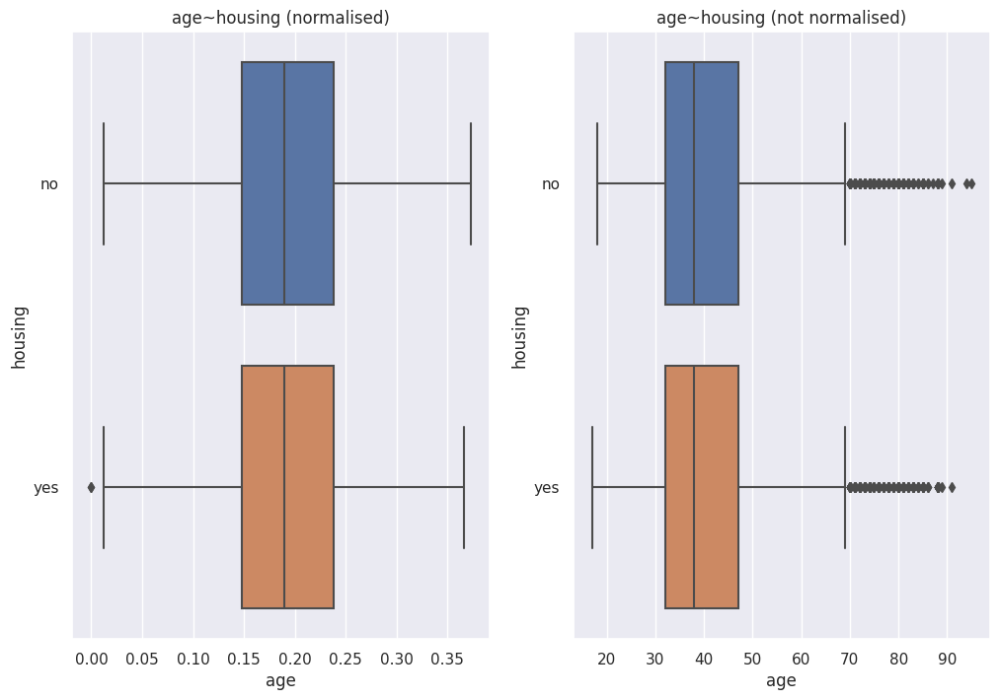

In [ ]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(1,2, 1)
sns.boxplot(data = df_cleaning2, x = "age", y = "housing")
ax.set_title("age~housing (normalised)")
ax = fig.add_subplot(1,2, 2)
sns.boxplot(data = df_cleaning1, x = "age", y = "housing")
ax.set_title("age~housing (not normalised)")

Text(0.5, 1.0, 'age~poutcome (not normalised)')

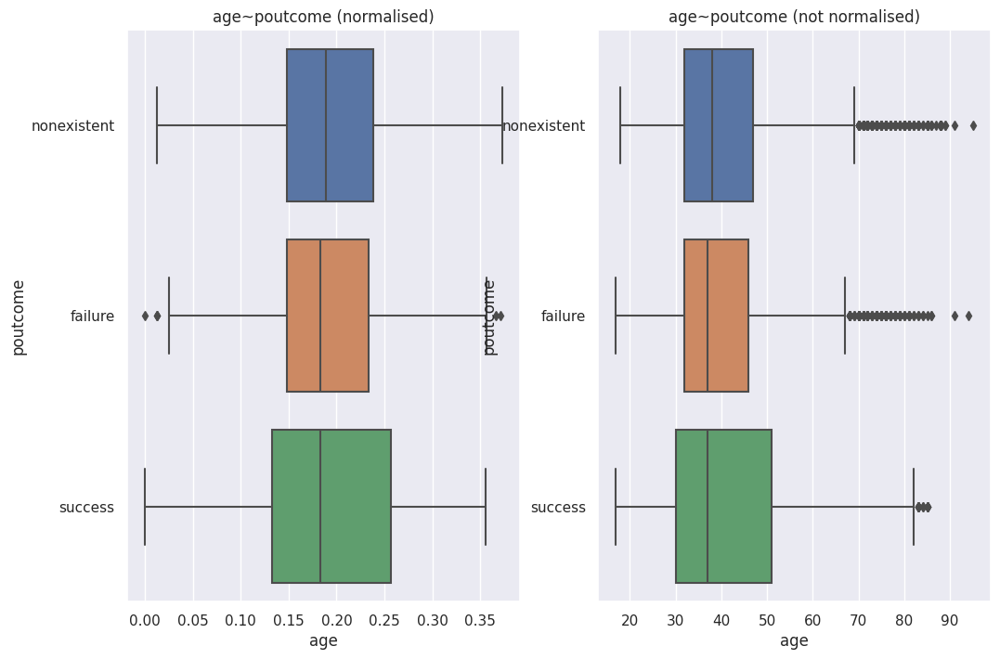

In [ ]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(1,2, 1)
sns.boxplot(data = df_cleaning2, x = "age", y = "poutcome")
ax.set_title("age~poutcome (normalised)")
ax = fig.add_subplot(1,2, 2)
sns.boxplot(data = df_cleaning1, x = "age", y = "poutcome")
ax.set_title("age~poutcome (not normalised)")

As we can also see, 3-rd quantile for success is higher, but it still not enough to distinguish those groups.

For others features we do not find any interesting patterns. Besides for some of them there were not any reason to expect correlation, like for features describing personal data and financial indicator which are from definition completely independent and if we were found correlation then it would be false correlation.

### Discretizations and binarizations

Now we are going to perform discretizazion.  We will discretize __previous__ because of the small group of atoms. We would also try apply unsupervised method for __duration__. We also will use supervised method for __campaign__, because of the visible pattern on previos scatter plot after application Box-Cox transform. Also an __age__ can be good to supervised discretization.

Discretization let us treat continuos feature in categorical way. The benefit is, in some cases classification algorithms required categorical variables. From other side we are able to create groups which will show better relations with different features or target variables.

We used supervised methods for those features which have some patterns or traits that we as humans recognized and would like to apply to our models.

As first we would check qualitative values of __day_of_week__ and __month__. We will apply ordinal encoding.

In [135]:
df_cleaning3 = df_cleaning2.copy()

In [137]:

conds = [
    (df_cleaning3["day_of_week"] == "mon"),
    (df_cleaning3["day_of_week"] == "tue"),
    (df_cleaning3["day_of_week"] == "wed"),
    (df_cleaning3["day_of_week"] == "thu"),
    (df_cleaning3["day_of_week"] == "fri"),
]
vals = np.arange(1,6)

df_cleaning3["day_of_week"] = np.select(conds, vals)

conds = [
    (df_cleaning3["month"] == "may"),
    (df_cleaning3["month"] == "jun"),
    (df_cleaning3["month"] == "jul"),
    (df_cleaning3["month"] == "aug"),
    (df_cleaning3["month"] == "oct"),
    (df_cleaning3["month"] == "nov"),
    (df_cleaning3["month"] == "dec"),
    (df_cleaning3["month"] == "mar"),
    (df_cleaning3["month"] == "apr"),
]
vals = np.arange(1,10)

df_cleaning3["month"] = np.select(conds, vals)

For supervised discertization of age more useful can be using not scaled values. Then bins size will be more natural.

We will use bins 10 year width. However, because of maximum and minimum values we will going to expand first and last group. Therefore we will have $\left[17,30\right]$ and $\left(80,95\right]$.

In [138]:
age_col = df_cleaning1["age"]

In [139]:

conds = [
    (age_col <= 30),
    ((age_col > 30) & (age_col <= 40)),
    ((age_col > 40) & (age_col <= 50)),
    ((age_col > 50) & (age_col <= 60)),
    ((age_col > 60) & (age_col <= 70)),
    ((age_col > 70) & (age_col <= 80)),
    ((age_col > 80) & (age_col <= 95))
]
vals = [
    "<=30",
    "30-40",
    "40-50",
    "50-60",
    "60-70",
    "70-80",
    "80<"
]

df_cleaning3["age"] = np.select(conds, vals)

[Text(0.5, 1.0, 'Dependences between age and job type'),
 Text(0.5, 0, 'age_groups'),
 Text(0, 0.5, 'number of observations')]

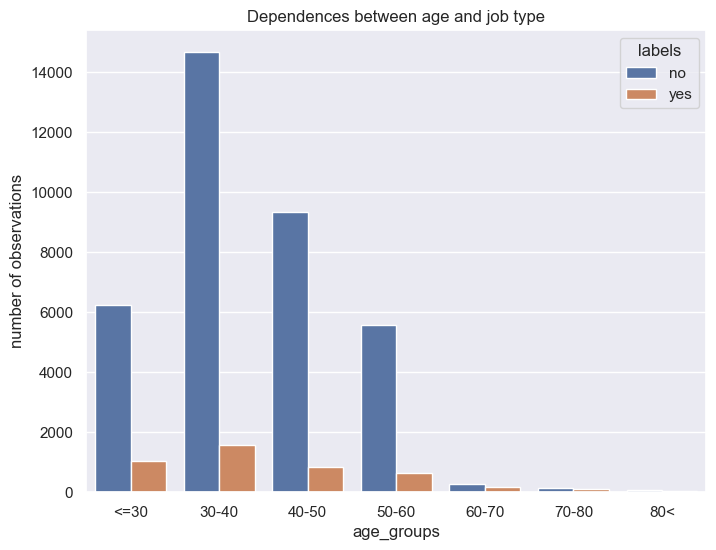

In [ ]:
sns.countplot(data=df_cleaning3, x='age', hue='labels', order = vals).set(title="Dependences between age and job type", xlabel='age_groups', ylabel='number of observations')

As we can see, it can be resonable to group all people older than 60.

In [140]:
df_cleaning3.loc[df_cleaning3["age"] == "60-70", "age"] = "60<"
df_cleaning3.loc[df_cleaning3["age"] == "70-80", "age"] = "60<"
df_cleaning3.loc[df_cleaning3["age"] == "80<", "age"] = "60<"

In [141]:
vals2 = [*vals[:-3], "60<"]

[Text(0.5, 1.0, 'Dependences between age and job type'),
 Text(0.5, 0, 'age_groups'),
 Text(0, 0.5, 'number of observations')]

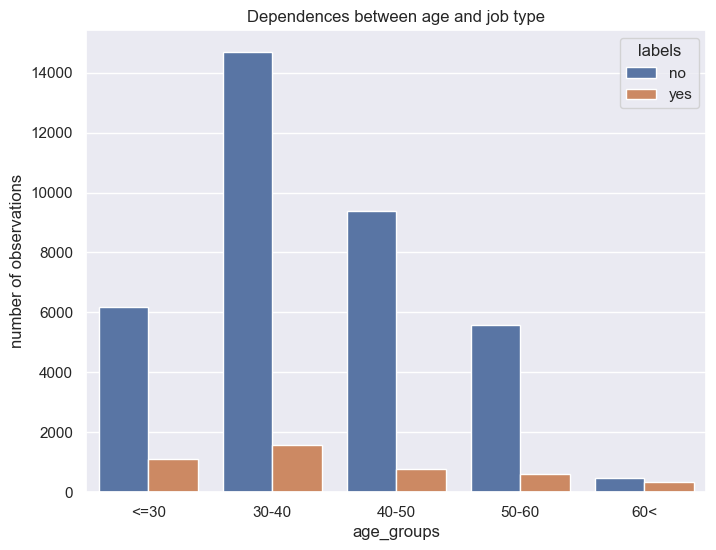

In [75]:
sns.countplot(data=df_cleaning3, x='age', hue='labels', order = vals2).set(title="Dependences between age and job type", xlabel='age_groups', ylabel='number of observations')

[Text(0.5, 1.0, 'Dependences between age and job type'),
 Text(0.5, 0, 'age_groups'),
 Text(0, 0.5, 'number of observations')]

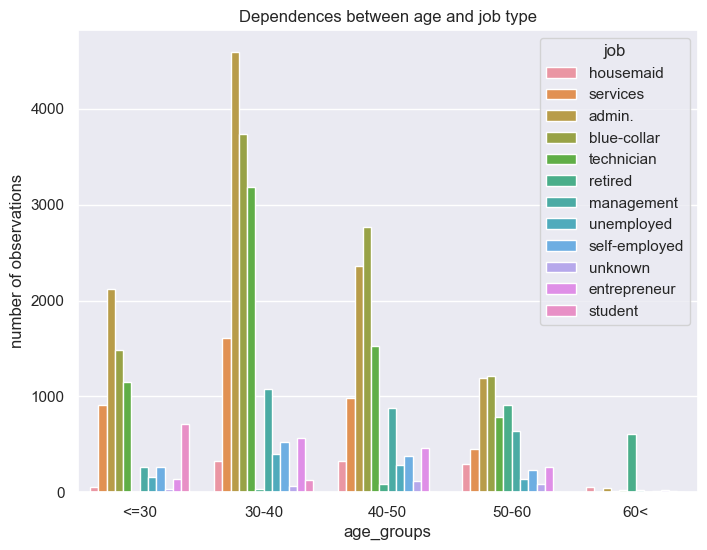

In [ ]:
sns.countplot(data=df_cleaning3, x='age',hue='job', order = vals2).set(title="Dependences between age and job type", xlabel='age_groups', ylabel='number of observations')

As we can see, now we are able for example, to build bar plot desribing relation between job and age. As we can see, the meaningful part of clients after 60s are blue-collars. For people aged 50-60 the diferance between different jobs is the smallest, when group in age 30-40 are mostly __administrators__, __technicians__ and __blue-collars__.

Now, we will deal with discretization of the __campaign__. We will try to do it in supervised approach, and create bins related with atoms of observations concentration. Let us remind this plot. Because this feature describe number of contacts we will apply to bins letters. Letters orders represent relation between numbers of contacts, e.g. A - the lowest number of contacts during campaign.


<Axes: xlabel='index', ylabel='campaign'>

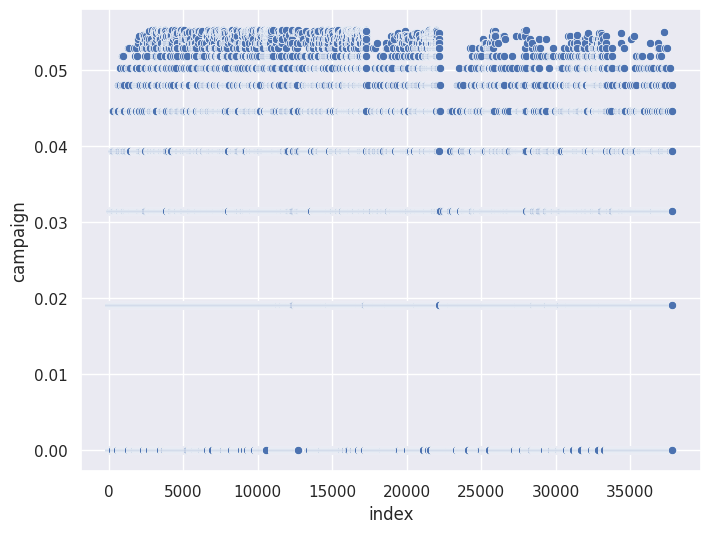

In [ ]:
sns.scatterplot(data = df_cleaning3.reset_index(), y = df_cleaning3["campaign"], x = "index")

In [ ]:
pd.unique(df_cleaning3["campaign"])

array([0.        , 0.01916379, 0.03145262, 0.03941299, 0.0446196 ,
       0.04805668, 0.05034581, 0.05188337, 0.05292455, 0.05363513,
       0.05412374, 0.05446214, 0.05469814, 0.05516657, 0.05525765,
       0.05486384, 0.05524871, 0.05526924, 0.05506418, 0.05512372,
       0.05498093, 0.05519756, 0.05522011, 0.05528432, 0.05528359,
       0.05528455, 0.05527784, 0.05527295, 0.05527573, 0.05528229,
       0.05523659, 0.05526429, 0.05527943, 0.05528158, 0.05528065,
       0.05528449, 0.05528404, 0.05528442, 0.05528284, 0.05528326,
       0.0552846 ])

In [142]:

conds = [
    (df_cleaning3["campaign"] == 0),
    ((df_cleaning3["campaign"] > 0) & (df_cleaning3["campaign"] <= 0.02)),
    ((df_cleaning3["campaign"] > 0.02) & (df_cleaning3["campaign"] <= 0.032)),
    ((df_cleaning3["campaign"] > 0.032) & (df_cleaning3["campaign"] <= 0.04)),
    ((df_cleaning3["campaign"] > 0.04) & (df_cleaning3["campaign"] <= 0.045)),
    ((df_cleaning3["campaign"] > 0.044) & (df_cleaning3["campaign"] <= 0.05)),
    ((df_cleaning3["campaign"] > 0.05) & (df_cleaning3["campaign"] <= 0.051)),
    (df_cleaning3["campaign"] > 0.051)
]
vals = [ chr(i + 65) for i in range(len(conds))]

df_cleaning3["campaign"] = np.select(conds, vals)

[Text(0.5, 1.0, 'Dependences between campaign and labels'),
 Text(0.5, 0, 'Campaign'),
 Text(0, 0.5, 'number of observations')]

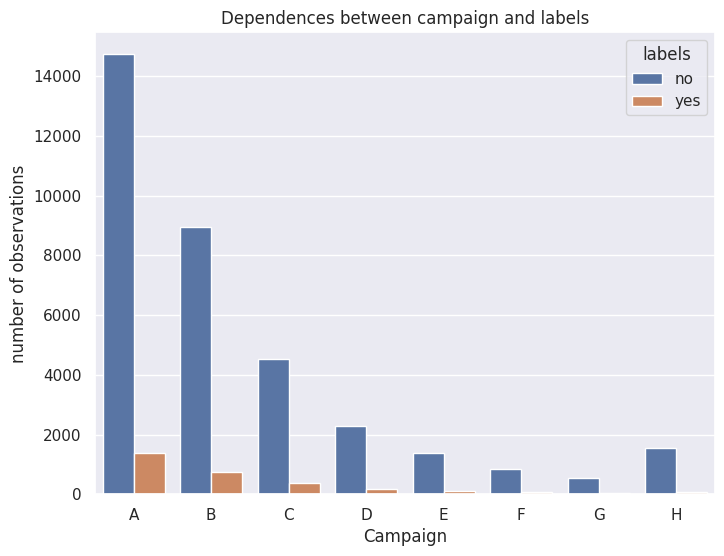

In [ ]:
sns.countplot(data=df_cleaning3, x='campaign', hue='labels').set(title="Dependences between campaign and labels", xlabel='Campaign', ylabel='number of observations')


Now we are going to discretize __duration__.

In [143]:
def discretization(col, real_labs, labels, strategy = "uniform", bins_ = None, hide = False):
    #Strategies 'uniform', 'quantile' , 'kmeans'
    bins_ = bins_ if  bins_ is not None else len(labels)
    fig = plt.figure(figsize=(12,9))
    ax = fig.add_subplot(1,2,1)
    sns.scatterplot(x = col, y = np.arange(len(col)), hue = real_labs)
    eps = 10
    ymin, ymax = 0 - eps, len(col) + eps
    discr = KBinsDiscretizer(n_bins= bins_, strategy= strategy)
    classes = discr.fit_transform(col.values.reshape(-1, 1))
    categories = np.sum(classes.toarray() * labels, axis=1)
    ax = fig.add_subplot(1,2,2)
    for line in discr.bin_edges_[0]:
        plt.vlines(line, ymin, ymax, color = "k", linestyles= "-.")
    sns.scatterplot(
        x = col,
        y = np.arange(len(col)),
        hue = categories,
        palette="tab10")
    if hide:
        plt.close()
    else:
        plt.show()
    return categories

def classify(preds, real):
    cats = pd.Series(preds)
    cats.name = "Expected"
    return(round(pd.crosstab(cats, real) / len(real) * 100, 2))

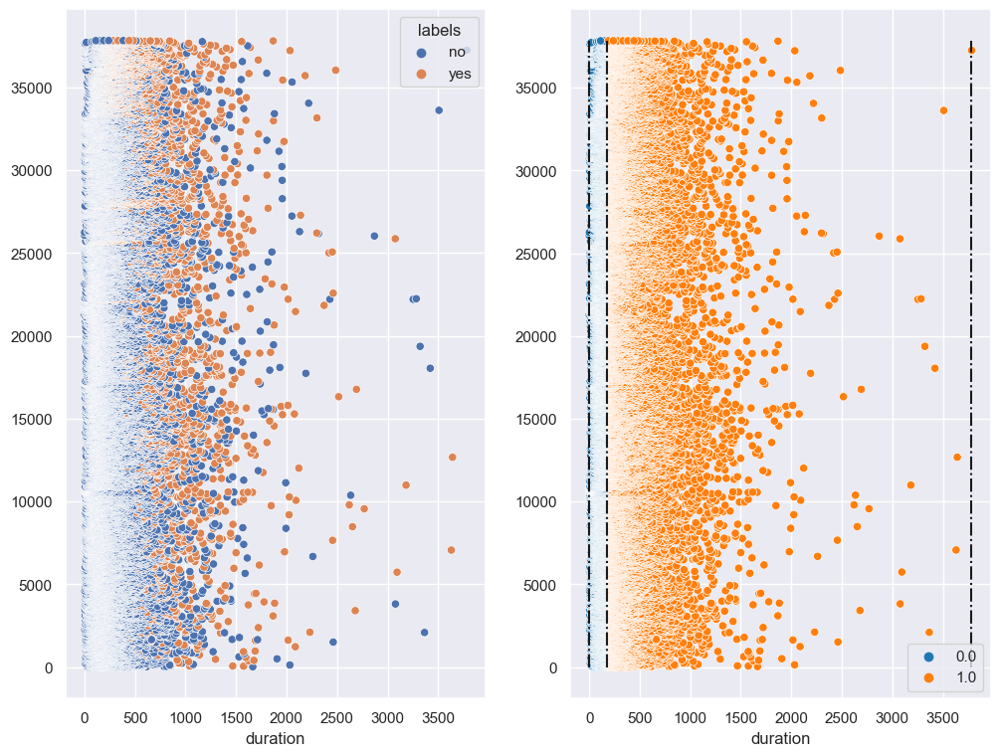

labels       no   yes
Expected             
0.0       42.78  3.29
1.0       42.04  4.06


In [ ]:
cats = discretization(
    df_cleaning1["duration"],
    df_cleaning1["labels"],
    [0, 1],
    "quantile"
)
print(classify(cats, df["labels"]))

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_discretization.py:248: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


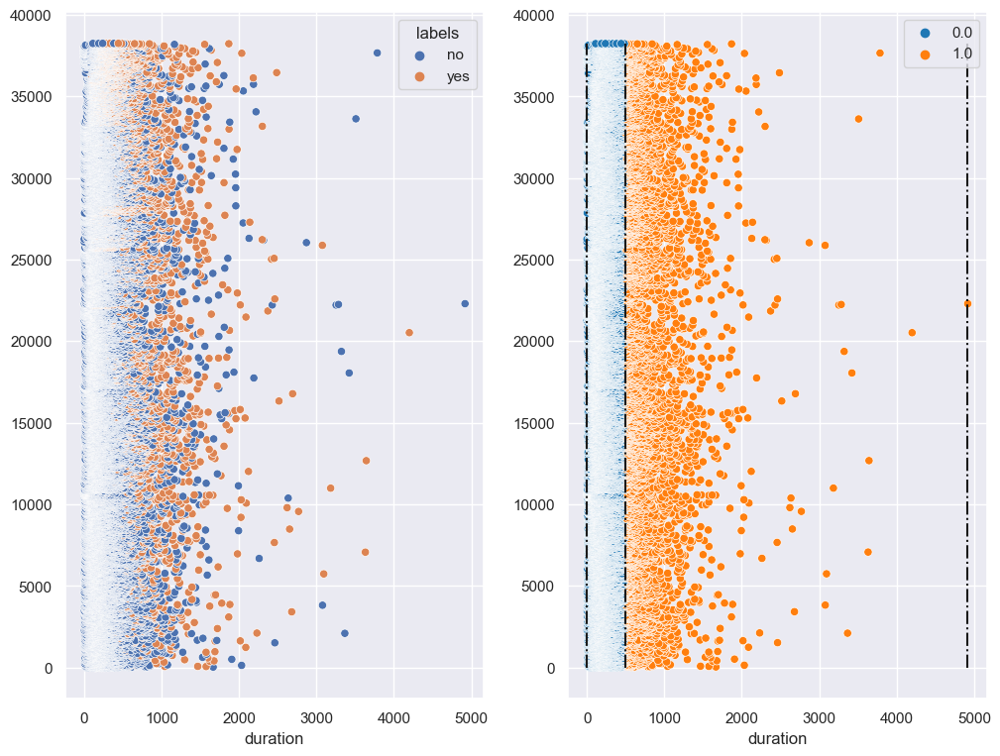

labels       no   yes
Expected             
0.0       74.96  6.75
1.0       10.45  0.93


In [ ]:
cats = discretization(
    df["duration"],
    df["labels"],
    [0, 1],
    "kmeans"
)
print(classify(cats, df["labels"]))

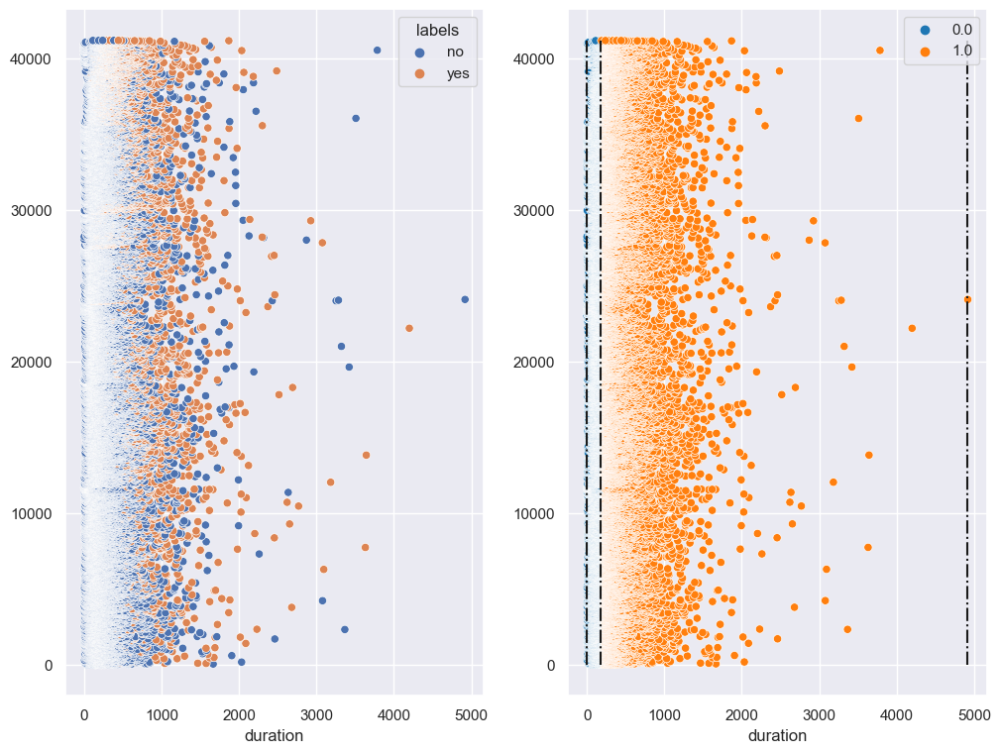

labels       no   yes
Expected             
0.0       48.63  1.35
1.0       40.10  9.91


In [ ]:
cats = discretization(
    df["duration"],
    df["labels"],
    [0, 1],
    "quantile"
)
print(classify(cats, df["labels"]))

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_discretization.py:248: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


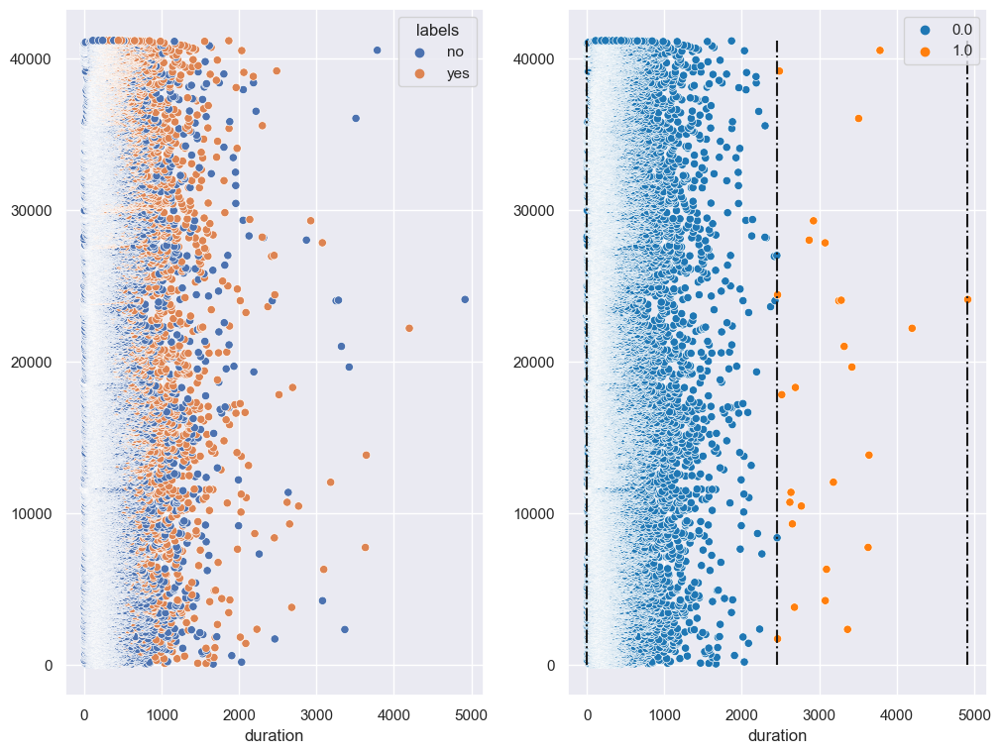

labels       no    yes
Expected              
0.0       88.71  11.23
1.0        0.03   0.04


In [ ]:
cats = discretization(
    df["duration"],
    df["labels"],
    [0, 1],
    "uniform"
)
print(classify(cats, df["labels"]))

We can see that duration increase probability that client will be interested in offer. Equal width disretization have I type error, but misclassifications in lower (11.26%).
We are going to try slightly different approach.

In [ ]:
cats = discretization(
    df["duration"],
    df["labels"],
    [0, 1, 1, 1],
    "uniform",
    hide = True
)
print(classify(cats, df["labels"]))
x = classify(cats, df["labels"])
print("Miss classified: ", x.iloc[0,1] + x.iloc[1, 0])

cats = discretization(
    df["duration"],
    df["labels"],
    [0, 1, 1, 1, 1],
    "uniform",
    hide = True
)
x = classify(cats, df["labels"])
print(x)
print("Miss classified: ", x.iloc[0,1] + x.iloc[1, 0])

cats = discretization(
    df["duration"],
    df["labels"],
    [0, 1, 1, 1, 1, 1],
    "uniform",
    hide = True
)
x = classify(cats, df["labels"])
print(x)
print("Miss classified: ", x.iloc[0,1] + x.iloc[1, 0])


cats = discretization(
    df["duration"],
    df["labels"],
    [0, 0, 1],
    "kmeans",
    hide = True
)
x = classify(cats, df["labels"])
print(x)
print("Miss classified: ", x.iloc[0,1] + x.iloc[1, 0])

cats = discretization(
    df["duration"],
    df["labels"],
    [0, 0, 0, 1],
    "kmeans",
    hide = True
)
x = classify(cats, df["labels"])
print(x)
print("Miss classified: ", x.iloc[0,1] + x.iloc[1, 0])
#WOE - weight of evidence, IV - information value TODO

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_discretization.py:248: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


labels       no    yes
Expected              
0.0       88.31  10.56
1.0        0.42   0.70
Miss classified:  10.98


C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_discretization.py:248: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


labels       no   yes
Expected             
0.0       87.73  9.81
1.0        1.00  1.45
Miss classified:  10.81


C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_discretization.py:248: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


labels       no   yes
Expected             
0.0       87.04  8.94
1.0        1.69  2.32
Miss classified:  10.629999999999999


C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_discretization.py:248: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


labels       no   yes
Expected             
0.0       87.06  8.96
1.0        1.67  2.31
Miss classified:  10.63


C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_discretization.py:248: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


labels       no    yes
Expected              
0.0       87.99  10.19
1.0        0.75   1.07
Miss classified:  10.94


We would like to apply the 3-rd method. As we can see, it has the highest number of missclassified observations between those semi-supervised variations, however it has the lowest number of incorreclty classified __yes__ labels. Because we are looking for clientes interested in the offer, we are aiming to correctly classify interested clients, because then company has returns.

In [145]:
cats = discretization(
    df["duration"],
    df["labels"],
    [0, 1, 1, 1, 1, 1],
    "uniform",
    hide = True
)
def add_col(df, arr_, col_name):
    buff = df.reset_index()
    buff[col_name] = pd.Series(arr_)
    return buff.drop(columns = "index")
df_cleaning3 = add_col(df_cleaning3, cats, "duration")

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_discretization.py:248: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


In [ ]:
import pickle
with open("project.pickle", "wb") as f:
    pickle.dump(
        {
            "df" : df,
            "df_cleaning1":  df_cleaning1,
            "df_cleaning2":  df_cleaning2,
            "df_cleaning3":  df_cleaning3
            },
        f

    )

Misclassification was reduced in disretization with kmeans method and  two bins produced by three bins with labels no , yes, yes

In next section we will use prepared data in goal of classification.

## Classification for K = 2 

In [239]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.preprocessing import LabelEncoder
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import classification_report, roc_curve, auc, roc_auc_score
from sklearn.metrics import RocCurveDisplay
from sklearn.preprocessing import LabelBinarizer
from itertools import cycle
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.ensemble import VotingClassifier
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from itertools import product
from sklearn.datasets import make_circles, make_classification, make_moons
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline
from matplotlib.colors import ListedColormap
from sklearn.feature_selection import SelectKBest, chi2

### Logistic regression model  

First of all, we collect all quantitative fetures (12) and then we will obtain the best 2 using RFE method.

In [310]:
df_to_analize = df_cleaning3.select_dtypes(include=np.number)

Given an external estimator that assigns weights to features (e.g., the coefficients of a linear model), the goal of __recursive feature elimination (RFE)__ is to select features by recursively considering smaller and smaller sets of features. First, the estimator is trained on the initial set of features and the importance of each feature is obtained either through any specific attribute or callable. Then, the least important features are pruned from current set of features. That procedure is recursively repeated on the pruned set until the desired number of features to select is eventually reached.

In [311]:
X = df_to_analize
y = df_cleaning3["loan"]
model = LogisticRegression()
le = LabelEncoder()
y = le.fit_transform(y)
rfe = RFE(model, n_features_to_select=2)
rfe.fit(X, y)

RFE(estimator=LogisticRegression(), n_features_to_select=2)

In [312]:
selected_features = [i for i, n in enumerate(list(rfe.support_)) if n == True]
df_with_2_columns = df_to_analize.iloc[:, selected_features]
df_with_2_columns.head()

,cons.price.idx,cons.conf.idx
0,0.698753,0.685714
1,0.698753,0.685714
2,0.698753,0.685714
3,0.698753,0.685714
4,0.698753,0.685714


As we can see, the best fitted columns are __cons.price.idx__ and __cons.conf.idx__

In [313]:
X_LR = df_with_2_columns
y_LR = df_cleaning3["loan"]
le = LabelEncoder()
y_binary = le.fit_transform(y_LR)

In [314]:
X_train, X_test, y_train, y_test = train_test_split(
    X_LR, y_binary, test_size=0.2, random_state=42)

scaler = StandardScaler() # Standardize features by removing the mean and scaling to unit variance
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [315]:
lin_reg = LogisticRegression() 
lin_reg.fit(X_train, y_train) 
y_pred = lin_reg.predict(X_test) 

In [316]:
print('mean_squared_error : ', mean_squared_error(y_test, y_pred)) 
print('mean_absolute_error : ', mean_absolute_error(y_test, y_pred)) 

mean_squared_error :  0.14853971190696444
mean_absolute_error :  0.14853971190696444


In [317]:
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Confusion Matrix:
 [[6443    0]
 [1124    0]]

Classification Report:
               precision    recall  f1-score   support

           0       0.85      1.00      0.92      6443
           1       0.00      0.00      0.00      1124

    accuracy                           0.85      7567
   macro avg       0.43      0.50      0.46      7567
weighted avg       0.72      0.85      0.78      7567



C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

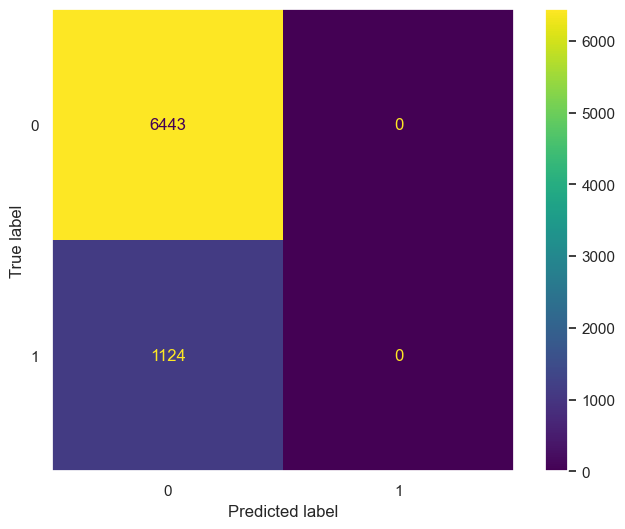

In [318]:
cm_display = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, y_pred))
cm_display.plot()
plt.grid(False)

A confusion matrix typically has rows representing the actual class and columns representing the predicted class. However, in our confusion matrix, it seems that there are only predictions for one class (class 0), and no predictions for the other class (class 1).

This could happen due to several reasons:

__Imbalance in Data:__

 If your dataset is highly imbalanced, with one class dominating the other, a classifier might predict the dominant class for most instances, resulting in few or no predictions for the minority class.

__Model Bias:__

 The model you're using might be biased towards predicting one class over the other. This can happen if the model is not able to capture the patterns present in the data for the minority class.

__Data Quality:__

 There might be issues with the data quality, such as missing values or incorrect labels, which could affect the predictions.

__Model Parameters:__

 The parameters of your model might need to be tuned to better handle the class imbalance, or a different model might be more suitable for your dataset.

In [319]:
scatter_plot_X_LR = df_with_2_columns.copy()
scatter_plot_X_LR["loan"] = y_binary
scatter_plot_X_LR.head()

,cons.price.idx,cons.conf.idx,loan
0,0.698753,0.685714,0
1,0.698753,0.685714,0
2,0.698753,0.685714,0
3,0.698753,0.685714,0
4,0.698753,0.685714,1


Decission boundaries for 2 classes (has loan ? Yes/no)

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


KeyboardInterrupt: 

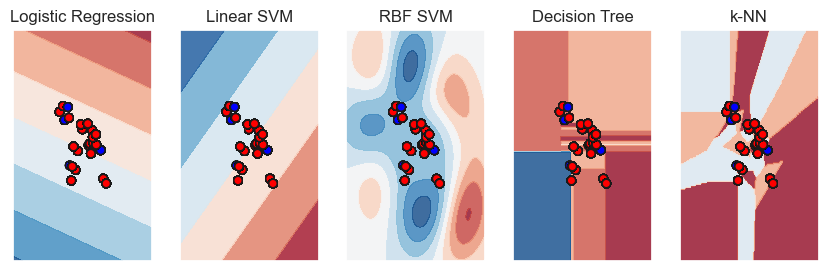

In [320]:
X, y = scatter_plot_X_LR.iloc[:, :2], scatter_plot_X_LR.iloc[:, 2]

# Define classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'Linear SVM': SVC(kernel='linear'),
    'RBF SVM': SVC(gamma=2),
    'Decision Tree': DecisionTreeClassifier(),
    'k-NN': KNeighborsClassifier(6),
    'Gaussian Process': GaussianProcessClassifier(1.0 * RBF(1.0), random_state=42),
    'Naive Bayes': GaussianNB(),
    'LDA': LinearDiscriminantAnalysis(),
    'QDA': QuadraticDiscriminantAnalysis()
}

# Plot decision boundaries
h = .02  # step size in the mesh
x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))

# Create color maps
cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])

# Create subplots
plt.figure(figsize=(len(classifiers) * 2 + 1, 3))
i = 1

for name, clf in classifiers.items():
    clf.fit(X, y)
    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    if hasattr(clf, "decision_function"):
        Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
    else:
        Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

    #result into a color plot
    Z = Z.reshape(xx.shape)
    plt.subplot(1, len(classifiers), i)
    plt.contourf(xx, yy, Z, cmap=cm, alpha=.8)

    #training points
    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, cmap=cm_bright, edgecolors='k')
    plt.title(name)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.xticks(())
    plt.yticks(())
    i += 1

plt.tight_layout()
plt.show()


## Classification for K >= 3

We will consider two simplest method: __Linear regression model__ and __The k-nearest neighbors (k-NN) algorithm__ for 3 dimensions or more (eg. marital status single/married/divorced).
Our goal is to construct a decision rule $G(x)$ (discrimination rule,
classification rule, classifier), which for any observation $x \in X$ will
assign membership to one of the classes from the set $G$.


## Linear regression model

The following example illustrates the use of a classical linear regression model to build a classification rule (classifier). For this purpose, we use a matrix of binary variables (0-1-2), indicating that particular objects belong to one of the K classes (indicator matrix responses).

[Text(0.5, 1.0, 'Marital status'),
 Text(0.5, 0, 'status'),
 Text(0, 0.5, 'number of observations')]

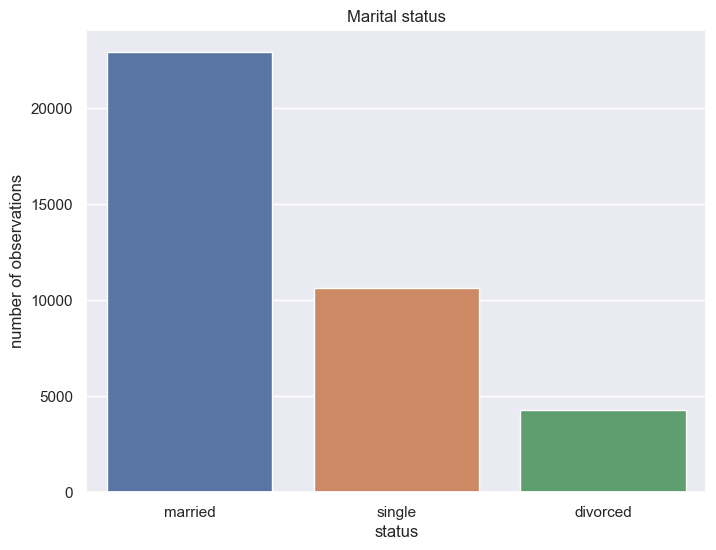

In [176]:
X = df_cleaning3["marital"] # marital status (categorical variable: "single", "married", "divorced")
sns.countplot(data=df_cleaning3, x='marital').set(title="Marital status", xlabel='status', ylabel='number of observations')

We need to convert our qualitative feature to quantitive one - this is related with linear regression properties.

In [177]:
X_numeric = []
for i in X:
    if i == "married":
        X_numeric.append(1)
    elif i == "divorced":
        X_numeric.append(0)
    else:
        X_numeric.append(2)

To do binary classification using linear regression we will use 4 quantitative features related with economic context of consumer:
1. __emp.var.rate__ employment variation rate - quarterly indicator (numeric)
2. __cons.price.idx__ consumer price index - monthly indicator (numeric)     
3. __cons.conf.idx__ consumer confidence index - monthly indicator (numeric)     
4. __euribor3m__ euribor 3 month rate - daily indicator (numeric)

To use Linear regression model using vector form, we need to add first column only with __1__ values. In this example we won't use features selection and we choose columns for X manually.

In [178]:
X_numeric_data = df_cleaning3[["emp.var.rate", "cons.price.idx", "cons.conf.idx", "euribor3m"]]
X_numeric_data.insert(loc = 0,
          column = 'col1',
          value = 1)
X_numeric_data

,col1,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m
0,1,0.937500,0.698753,0.685714,0.957379
1,1,0.937500,0.698753,0.685714,0.957379
2,1,0.937500,0.698753,0.685714,0.957379
3,1,0.937500,0.698753,0.685714,0.957379
4,1,0.937500,0.698753,0.685714,0.957379
...,...,...,...,...,...
37829,1,0.479167,1.000000,0.000000,0.089322
37830,1,0.479167,1.000000,0.000000,0.089322
37831,1,0.479167,1.000000,0.000000,0.089322
37832,1,0.479167,1.000000,0.000000,0.089322


In [179]:
K = 3 # number of classes 
Y_data = np.zeros((len(X_numeric_data),K))
labels_num = np.array(X_numeric)
for k in range(0, K):
    Y_data[labels_num==k, k] = 1

### Estimation of coefficients and prediction

As we obtain 37834 rows after EDA part, to do better visualization we randomly selected 1000 observations from predicted Y values. 

Text(0.5, 1.0, 'predicted probabilities of belonging to particular classes (1000 observations)')

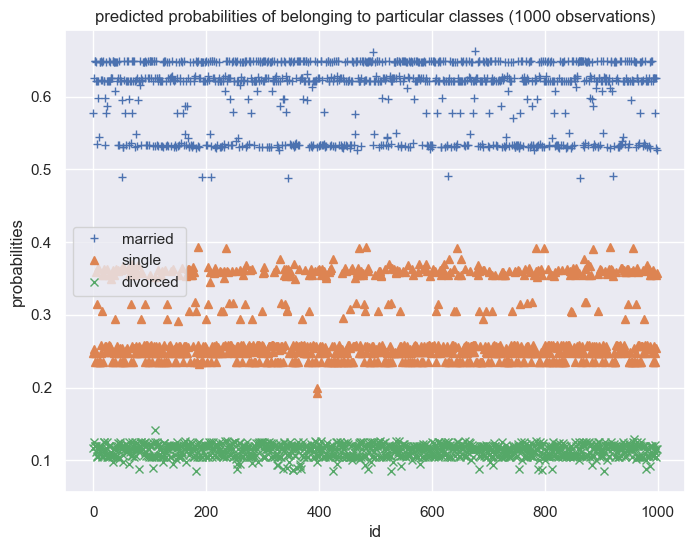

In [180]:
beta = np.linalg.inv(X_numeric_data.T.dot(X_numeric_data)).dot(X_numeric_data.T).dot(Y_data) # least squares method
Y_hat = X_numeric_data.dot(beta) # predicted probabilities of belonging to particular classes

num_selected = 1000
random_selection_0 = random.sample(list(Y_hat[0]), num_selected)
random_selection_1 = random.sample(list(Y_hat[1]), num_selected)
random_selection_2 = random.sample(list(Y_hat[2]), num_selected)
plt.plot(random_selection_1, marker='+', linestyle='', label="married")
plt.plot(random_selection_2, marker='^', linestyle='', label="single")
plt.plot(random_selection_0, marker='x', linestyle='', label="divorced")
plt.legend()
plt.xlabel("id")
plt.ylabel("probabilities")
plt.title("predicted probabilities of belonging to particular classes (1000 observations)")

We clearly see the difference between predicted marital status for our observations - as people with married status are the most numerous group, they have biggest probabilty to occur and similarly for single and divorced groups. But is this approach 100% correct and we don't observe class masking problem?
To answer this question let's look at probabilities matrix.

In [181]:
print(Y_hat)

              0         1         2
0      0.115113  0.649388  0.235499
1      0.115113  0.649388  0.235499
2      0.115113  0.649388  0.235499
3      0.115113  0.649388  0.235499
4      0.115113  0.649388  0.235499
...         ...       ...       ...
37829  0.120593  0.486824  0.392583
37830  0.120593  0.486824  0.392583
37831  0.120593  0.486824  0.392583
37832  0.120593  0.486824  0.392583
37833  0.120593  0.486824  0.392583

[37834 rows x 3 columns]


In [182]:
classes = sorted(df_cleaning3["marital"].unique())
print(classes)

['divorced', 'married', 'single']


In [183]:
max_ind = np.argmax(Y_hat, axis = 1) #find index of maximum value in each row 
print(list(max_ind).count(1))

37834


As we can see, __married__ people have the biggest probability to occur in the dataset in each row so there is no possibility to predict __single__ or __divorced__ class. The accuracy of the model takes a hit here and confussion matrix won't have sense. 

In [184]:
predicted_labels = np.array(classes)[max_ind]
print(predicted_labels)

['married' 'married' 'married' ... 'married' 'married' 'married']


Hence to avoid this we use an algorithm called the Logistic Regression which is a binary classification algorithm to stepover these practical problems that hold back Linear Regression for classification.

Logistic Regression deals with discrete values unlike Linear Regression and also maintains the value of the threshold even when new data points are added.

### Confusion matrix and classification accuracy

Let's see If our above assumptions were correct.

In [191]:
real_labels = list(df_cleaning3["marital"])
cm = confusion_matrix(real_labels, predicted_labels)

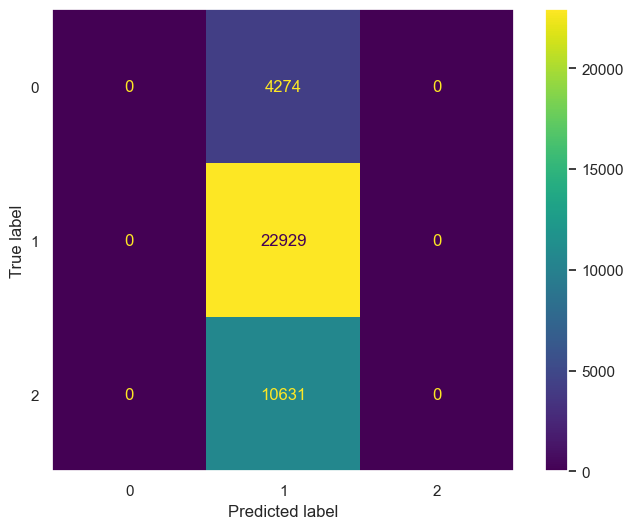

In [192]:
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm)
cm_display.plot()
plt.grid(False)

There is only prediction for __maried__ group so we need to try fit different algorithm.

## K-NN algorithm

The k-NN algorithm can be easily generalized for the multi-class case, i.e. K ≥ 3 classes. Decision rule for this algorithm means, the X object is assigned to the class to which belong most of its k- nearest neighbors (from the learning set). Formally, the k-NN method estimates directly the posterior probabilities.

Again, we will use data defined in Linear Regression model.

In [200]:
X_knn_data = df_cleaning3[["emp.var.rate", "cons.price.idx", "cons.conf.idx", "euribor3m"]]
Y_knn_data = df_cleaning3["marital"]

In [201]:
sc = StandardScaler() # Standardize features by removing the mean and scaling to unit variance
X = sc.fit_transform(X_knn_data)
le = LabelEncoder() # Encode target labels with value between 0 and n_classes-1
y = le.fit_transform(Y_knn_data)

In [202]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

For now, we randomly select k-nearest neighbors (k = 3). Later we will use cross validation to get the best value of k.

In [203]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

In [204]:
accuracy = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)

print("Accuracy: {:.2f}%".format(accuracy * 100))
print("Confusion_matrix:")
print(cm)

Accuracy: 47.13%
Confusion_matrix:
[[ 115  546  177]
 [ 670 2901 1036]
 [ 306 1266  550]]


In this example, accuracy of the model is around 47% with k=3.

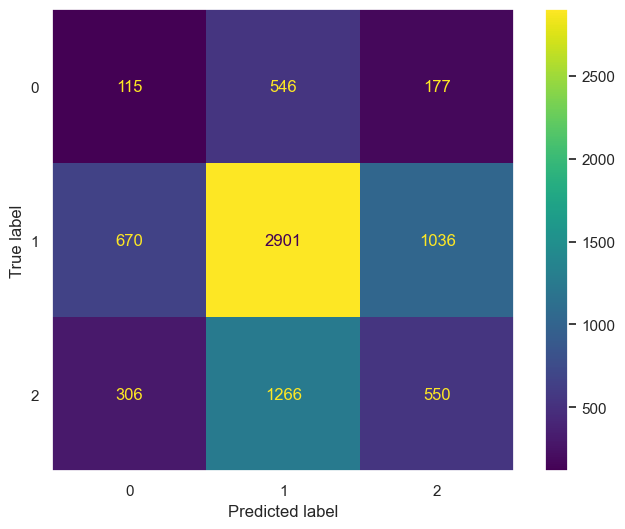

In [205]:
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm)
cm_display.plot()
plt.grid(False)

In [206]:
def perf_measure(y_actual, y_hat):
    TP = 0
    FP = 0
    TN = 0
    FN = 0

    for i in range(len(y_hat)): 
        if y_actual[i]==y_hat[i]==1:
           TP += 1
        if y_hat[i]==1 and y_actual[i]!=y_hat[i]:
           FP += 1
        if y_actual[i]==y_hat[i]==0:
           TN += 1
        if y_hat[i]==0 and y_actual[i]!=y_hat[i]:
           FN += 1

    print('True Positive :', TP)
    print('True Negative :', TN)
    print('False Positive :', FP)
    print('False Negative :', FN)

In [207]:
perf_measure(y_test, y_pred)

True Positive : 2901
True Negative : 115
False Positive : 1812
False Negative : 976


For our example, the positive value is "married" status, and the negative values are "divorced" and "single" status.

__True Positive:__

 It means the actual value and also the predicted values are the same. In our case, the actual value is also "married" status, and the model prediction is also "married" status. If you observe the TP cell, the positive value is the same for Actual and predicted.

__False Negative:__

 This means the actual value is positive. In our case, it is "married" status, but the model has predicted it as negative, i.e., "divorced" and "single" status. So the model has given the wrong prediction. It was supposed to give a positive ("married" status), but it has given a negative ("divorced" and "single" status). So whatever the negative output we got is false; hence the name False Negative.

__False Positive:__

 This means the actual value is negative. In our case, it is "divorced" and "single" status, but the model has predicted it as positive, i.e., "married" status. So the model has given the wrong prediction. It was supposed to give a negative ("divorced" and "single" status), but it has given a positive ("married" status), so whatever the positive output we got is false, hence the name False Positive.
 
__True Negative:__

 It means the actual value and also the predicted values are the same. In our case, the actual values are are "divorced" and "single" status, and the prediction is also are "divorced" and "single" status. 
 
 The values for the above example are: TP=2901, FN=976, FP=1812, TN=115.

Now, let's see how k parameter fits with this model during multiple execution. To do this we execute K_NN algorithm 50 times and calculate average accuracy score.

In [208]:
def multiple_KNN_execution(X_knn_data, Y_knn_data, k):
    number_of_executions = [i for i in range (1,51)]
    accuracy_list = []
    for _ in number_of_executions:
        sc = StandardScaler() # Standardize features by removing the mean and scaling to unit variance
        X = sc.fit_transform(X_knn_data)
        le = LabelEncoder() # Encode target labels with value between 0 and n_classes-1
        y = le.fit_transform(Y_knn_data)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(X_train, y_train)
        y_pred = knn.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_list.append(accuracy)
    sns.lineplot(x=number_of_executions, y=accuracy_list, marker='o')
    plt.xlabel("Number of execution")
    plt.ylabel("Accuracy Score")
    plt.title("Long-term accuracy for K_NN model with particular k parameter")
    print(f"Average accuracy for k = {k}: ", np.mean(accuracy_list))

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Average accuracy for k = 3:  0.4942487115105061


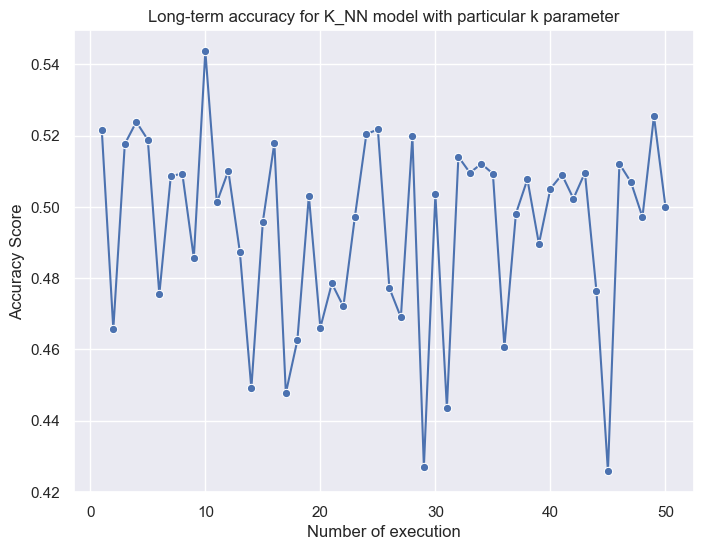

In [209]:
multiple_KNN_execution(X_knn_data, Y_knn_data, 3)

Average accuracy for k = 3 is around 49 %. We want to find parameter which has the best fit for our model.

### Cross Validation to Get the Best Value of k

In [210]:
k_values = [i for i in range (1,51)]
scores = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    score = cross_val_score(knn, X, y, cv=5)
    scores.append(np.mean(score))

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, 'cross validation to get the best value of k')

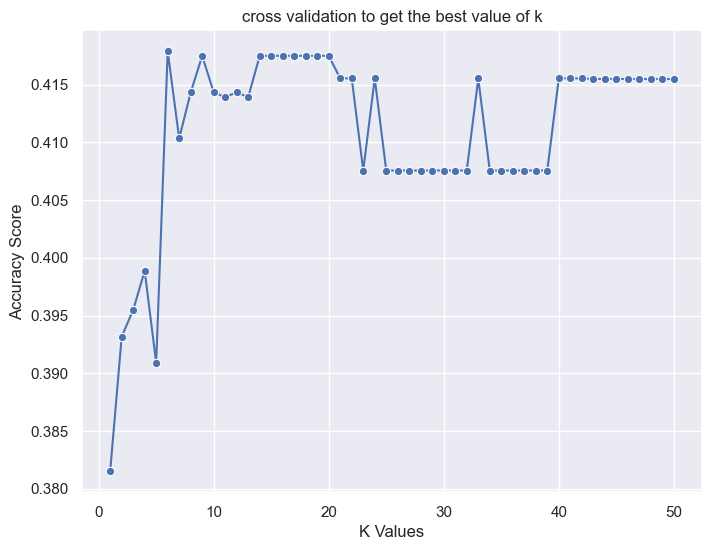

In [211]:
sns.lineplot(x = k_values, y = scores, marker = 'o')
plt.xlabel("K Values")
plt.ylabel("Accuracy Score")
plt.title("cross validation to get the best value of k")

In [212]:
best_index = np.argmax(scores)
best_k = k_values[best_index]

knn = KNeighborsClassifier(n_neighbors=best_k)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6)

Apparently, the best k parameter for our model is k=6. Now we will recompile our function to calculate mean accuracy score again.

In [213]:
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[ 115  546  177]
 [ 670 2901 1036]
 [ 306 1266  550]]


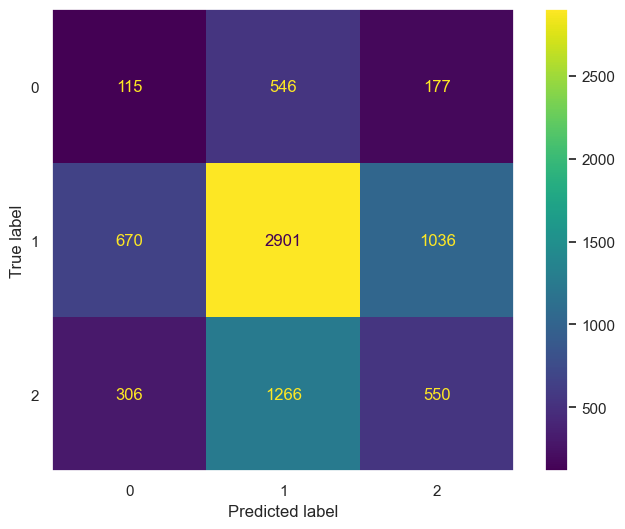

In [214]:
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm)
cm_display.plot()
plt.grid(False)

In [215]:
perf_measure(y_test, y_pred)

True Positive : 2901
True Negative : 115
False Positive : 1812
False Negative : 976


C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Average accuracy for k = 6:  0.5509078895202856


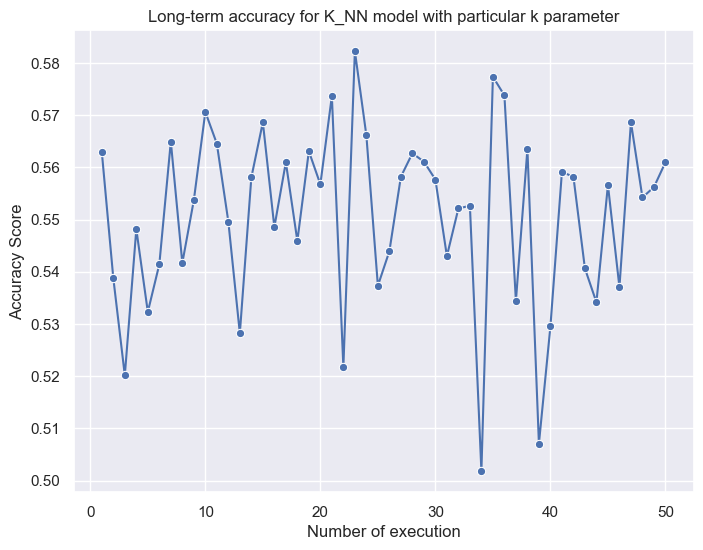

In [217]:
multiple_KNN_execution(X_knn_data, Y_knn_data, 6)

Now average accuracy for k=6 is around 55%, so with simply cross-validation task we obtain around 6% increase in model accuracy.

## Linear Discriminant Analysis (LDA)

Linear discriminant analysis (LDA), also known as normal discriminant analysis (NDA) or discriminant function analysis (DFA), builds on Fisher's linear discriminant, a statistical approach pioneered by Sir Ronald Fisher. It is a dimensionality reduction technique that is used in supervised machine learning.

The primary function of LDA is to project high-dimensional data on to a lower-dimensional space while retaining the data's inherent class separability. LDA can be applied to enhance the operation of classification algorithms such as a decision tree or random forest.

Let's try to find the best fetures using RFE method again.

In [220]:
X = df_to_analize
y = df_cleaning3["marital"]
le = LabelEncoder()
y = le.fit_transform(y)
lda = LinearDiscriminantAnalysis()
rfe = RFE(estimator=lda, n_features_to_select=2, step=1)
rfe.fit(X, y)
selected_features = rfe.support_
print("Selected Features:", selected_features)

Selected Features: [False False False False False  True False False  True False False]


In [221]:
selected_features = [i for i, n in enumerate(list(selected_features)) if n == True]
df_with_2_columns = df_to_analize.iloc[:, selected_features]
df_with_2_columns.head()

,emp.var.rate,euribor3m
0,0.9375,0.957379
1,0.9375,0.957379
2,0.9375,0.957379
3,0.9375,0.957379
4,0.9375,0.957379


Apparently for LDA the best features are __emp.var.rate__ and __eurivor3m__.

In [223]:
X_LDA = df_with_2_columns
y_LDA = df_cleaning3["marital"]

In [226]:
sc = StandardScaler()
X = sc.fit_transform(X_LDA)
le = LabelEncoder()
y = le.fit_transform(y_LDA)

X_train, X_test,\
    y_train, y_test = train_test_split(X, y,
                                       test_size=0.2, random_state=42)

In this step, we applied LDA to the training data set, transforming the four-dimensional feature space into a two-dimensional subspace while maximizing the separation between classes. The outcome was a training data set with reduced dimensions.

In [227]:
# apply Linear Discriminant Analysis
lda = LinearDiscriminantAnalysis(n_components=2)
X_train = lda.fit_transform(X_train, y_train)
X_test = lda.transform(X_test)

In [228]:
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[ 124  501  206]
 [ 639 2899 1059]
 [ 328 1313  498]]


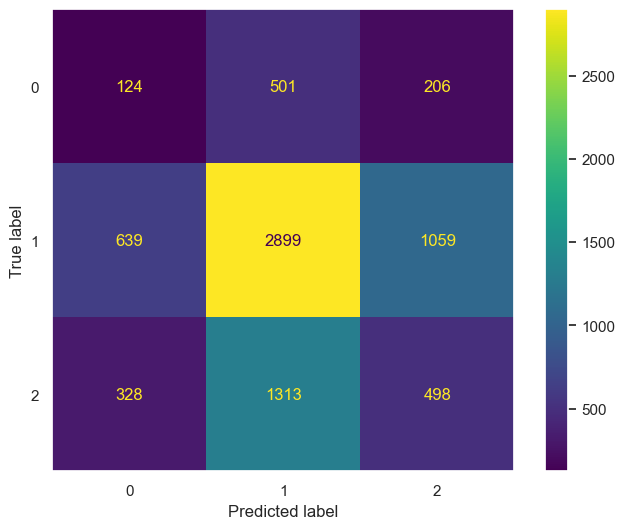

In [230]:
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm)
cm_display.plot()
plt.grid(False)

In [231]:
def perf_measure(y_actual, y_hat):
    TP = 0
    FP = 0
    TN = 0
    FN = 0

    for i in range(len(y_hat)): 
        if y_actual[i]==y_hat[i]==1:
           TP += 1
        if y_hat[i]==1 and y_actual[i]!=y_hat[i]:
           FP += 1
        if y_actual[i]==y_hat[i]==0:
           TN += 1
        if y_hat[i]==0 and y_actual[i]!=y_hat[i]:
           FN += 1

    print('True Positive :', TP)
    print('True Negative :', TN)
    print('False Positive :', FP)
    print('False Negative :', FN)

In [278]:
perf_measure(y_test, y_pred)
print("\nClassification Report:\n", classification_report(y_test, y_pred))

True Positive : 4351
True Negative : 0
False Positive : 2761
False Negative : 0

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       861
           1       0.61      0.95      0.74      4589
           2       0.37      0.08      0.13      2117

    accuracy                           0.60      7567
   macro avg       0.33      0.34      0.29      7567
weighted avg       0.47      0.60      0.49      7567



C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

## Quadratic Discriminant Analysis (QDA)

Quadratic discriminant analysis (QDA) is closely related to linear discriminant analysis (LDA), where it is assumed that the measurements from each class are normally distributed. Unlike LDA however, in QDA there is no assumption that the covariance of each of the classes is identical. When the normality assumption is true, the best possible test for the hypothesis that a given measurement is from a given class is the likelihood ratio test. 

We do the same approach for features handling as in LDA.

In [266]:
X = df_to_analize
y = df_cleaning3["marital"]
le = LabelEncoder()
y = le.fit_transform(y)
qda = QuadraticDiscriminantAnalysis()
kbest = SelectKBest(score_func=chi2, k=2)
X_selected = kbest.fit_transform(X, y)
selected_features = kbest.get_support()

In [267]:
selected_features = [i for i, n in enumerate(list(selected_features)) if n == True]
df_with_2_columns = df_to_analize.iloc[:, selected_features]
df_with_2_columns.head()

,emp.var.rate,euribor3m
0,0.9375,0.957379
1,0.9375,0.957379
2,0.9375,0.957379
3,0.9375,0.957379
4,0.9375,0.957379


Apparently for QDA the best features are __emp.var.rate__ and __eurivor3m__.

In [325]:
X_QDA = df_with_2_columns
y_QDA = df_cleaning3["marital"]

In [326]:
sc = StandardScaler()
X = sc.fit_transform(X_QDA)
le = LabelEncoder()
y = le.fit_transform(y_QDA)

X_train, X_test,\
    y_train, y_test = train_test_split(X, y,
                                       test_size=0.2)

In [270]:
# apply Linear Discriminant Analysis
qda = QuadraticDiscriminantAnalysis()
X_train = qda.fit(X_train, y_train)
y_pred = qda.predict(X_test)

In [272]:
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[   0  812   49]
 [   0 4351  238]
 [   0 1949  168]]


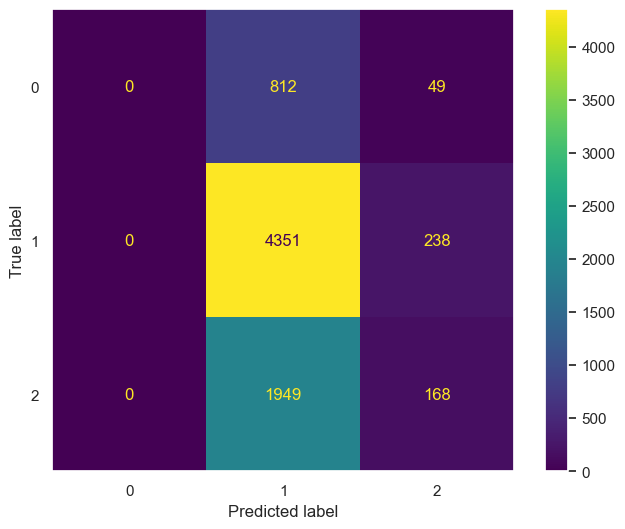

In [273]:
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm)
cm_display.plot()
plt.grid(False)

In [274]:
def perf_measure(y_actual, y_hat):
    TP = 0
    FP = 0
    TN = 0
    FN = 0

    for i in range(len(y_hat)): 
        if y_actual[i]==y_hat[i]==1:
           TP += 1
        if y_hat[i]==1 and y_actual[i]!=y_hat[i]:
           FP += 1
        if y_actual[i]==y_hat[i]==0:
           TN += 1
        if y_hat[i]==0 and y_actual[i]!=y_hat[i]:
           FN += 1

    print('True Positive :', TP)
    print('True Negative :', TN)
    print('False Positive :', FP)
    print('False Negative :', FN)

In [275]:
perf_measure(y_test, y_pred)

True Positive : 4351
True Negative : 0
False Positive : 2761
False Negative : 0


In [277]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy of QDA:", accuracy)
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy of QDA: 0.5971983613056694

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       861
           1       0.61      0.95      0.74      4589
           2       0.37      0.08      0.13      2117

    accuracy                           0.60      7567
   macro avg       0.33      0.34      0.29      7567
weighted avg       0.47      0.60      0.49      7567



C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

Accuracy of our model using QDA algorithm is around 60%. There is another idea to use Quadrative Discriminant Analysis. __Repeated K-Fold Cross Validation__ as the name depicts this method repeats K-Fold Cross validator n times with different randomisation in each repetition. Same as K-Fold entire data set is divided into k subsets. For each iteration one subset is taken as validation set and remaining subsets as training sets.

In [323]:
from sklearn.model_selection import RepeatedStratifiedKFold
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(qda, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
print("K-Fold Cross Validation", np.mean(scores))
print("Accuracy of QDA:", accuracy)

K-Fold Cross Validation 0.8438177302598306
Accuracy of QDA: 0.5971983613056694


There is significant difference between methods (around 25%!!!). It also shows, how important the method choosing is.  

Text(0.5, 1.0, 'Decision boundaries using QDA')

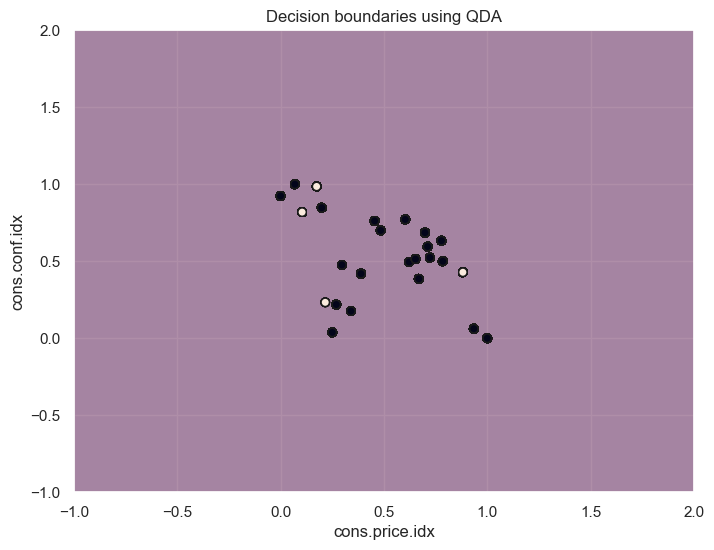

In [324]:
X = d.iloc[:, :2]
y = scatter_plot_X_LR.iloc[:, 2]
classifier = QuadraticDiscriminantAnalysis().fit(X, y)
disp = DecisionBoundaryDisplay.from_estimator(
    classifier, X, response_method="predict",
    xlabel=X.columns[0], ylabel=X.columns[1],
    alpha=0.5
 )
disp.ax_.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, edgecolor="k")
plt.title("Decision boundaries using QDA")

### Logistic Regression (LR)

Logistic regression aims to solve classification problems. It does this by predicting categorical outcomes, unlike linear regression that predicts a continuous outcome.

In [ ]:
df_to_analize = df_cleaning3.select_dtypes(include=np.number)
df_to_analize.insert(0, 'age', df_cleaning3['age'])
df_to_analize

,age,month,day_of_week,duration,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,duration2
0,0.276629,1,1,0.053070,999,0.000000,0.937500,0.698753,0.685714,0.957379,0.859735,0.034793
1,0.280344,1,1,0.030297,999,0.000000,0.937500,0.698753,0.685714,0.957379,0.859735,0.023572
2,0.182801,1,1,0.045954,999,0.000000,0.937500,0.698753,0.685714,0.957379,0.859735,0.031735
3,0.201232,1,1,0.030704,999,0.000000,0.937500,0.698753,0.685714,0.957379,0.859735,0.023813
4,0.276629,1,1,0.062424,999,0.000000,0.937500,0.698753,0.685714,0.957379,0.859735,0.038301
...,...,...,...,...,...,...,...,...,...,...,...,...
37831,0.328854,6,5,0.067914,999,0.000000,0.479167,1.000000,0.000000,0.089322,0.000000,0.040122
37832,0.233519,6,5,0.077877,999,0.000000,0.479167,1.000000,0.000000,0.089322,0.000000,0.043035
37833,0.276629,6,5,0.038430,999,0.000000,0.479167,1.000000,0.000000,0.089322,0.000000,0.028081
37834,0.223374,6,5,0.089874,999,0.000000,0.479167,1.000000,0.000000,0.089322,0.000000,0.045973


We will choose 2 features for X vector because 2 are needed for sklearn decision boundary algorithm. 

In [316]:
X = df_to_analize
y = df_cleaning3["marital"]
model = LogisticRegression()
le = LabelEncoder()
y = le.fit_transform(y)
rfe = RFE(model, n_features_to_select=2)
rfe.fit(X, y)

C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mo

RFE(estimator=LogisticRegression(), n_features_to_select=2)

In [325]:
selected_features = [i for i, n in enumerate(list(rfe.support_)) if n == True]
df_with_2_columns = df_to_analize.iloc[:, selected_features]
df_with_2_columns.head()

,age,cons.conf.idx
0,0.276629,0.685714
1,0.280344,0.685714
2,0.182801,0.685714
3,0.201232,0.685714
4,0.276629,0.685714


We obtain 2 most suitable columns for Linear regression model: __age__, __cons.conf.idx__

In [327]:
X_LR = df_with_2_columns
y_LR = df_cleaning3["marital"]
le = LabelEncoder()
y_binary = le.fit_transform(y_LR)

In [328]:
X_train, X_test, y_train, y_test = train_test_split(
    X_LR, y_binary, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [329]:
logr = LogisticRegression()
logr.fit(X_train, y_train)

LogisticRegression()

In [330]:
y_pred = logr.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 66.73%


Accuracy of our 2 fetures fitted in Logistic regression model is approx 67% so we can assume that this combination of 2 columns gave the biggest accuracy. It could be intresting to check how model behave with more futures. 

Now lets look at confusion matrix.

In [331]:
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Confusion Matrix:
 [[   0  776   52]
 [   0 4076  501]
 [   0 1189  974]]

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       828
           1       0.67      0.89      0.77      4577
           2       0.64      0.45      0.53      2163

    accuracy                           0.67      7568
   macro avg       0.44      0.45      0.43      7568
weighted avg       0.59      0.67      0.62      7568



C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\kubam\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

At first sight we can observe that the first column in confusion matrix has only 0s. This means that for all instances where the actual class is the first class (represented by the first row), the classifier has predicted it as belonging to the other classes.

This situation usually occurs when there is an imbalance in the classes, especially when one class dominates the dataset (As in our case __married__ group). In such cases, the classifier tends to predict the dominant class more frequently, leading to fewer predictions for the minority classes. To address this issue, we can use evaluation metrics that are less sensitive to class imbalance, such as precision, recall, F1-score (which are also 0s), or area under the ROC curve (AUC-ROC).

In [332]:
label_binarizer = LabelBinarizer().fit(y_train)
classifier = LogisticRegression()
y_onehot_test = label_binarizer.transform(y_test)
y_onehot_test.shape  # (n_samples, n_classes)
y_score = classifier.fit(X_train, y_train).predict_proba(X_test)

The One-vs-the-Rest (OvR) multiclass strategy, also known as one-vs-all, consists in computing a ROC curve per each of the n_classes. In each step, a given class is regarded as the positive class and the remaining classes are regarded as the negative class as a bulk.

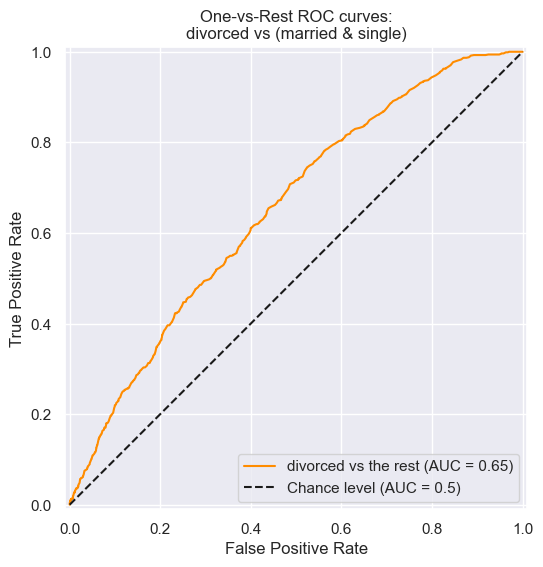

In [333]:
class_of_interest = ["divorced", "married", "single"]
display_divorced = RocCurveDisplay.from_predictions(
    y_onehot_test[:, 0],
    y_score[:, 0],
    name=f"{class_of_interest[0]} vs the rest",
    color="darkorange",
    plot_chance_level=True,
)
_ = display_divorced.ax_.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="One-vs-Rest ROC curves:\ndivorced vs (married & single)",
)

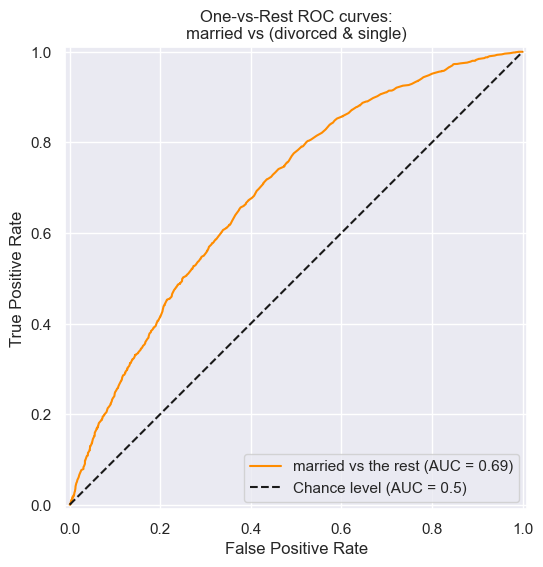

In [342]:
class_of_interest = ["divorced", "married", "single"]
display_married = RocCurveDisplay.from_predictions(
    y_onehot_test[:, 1],
    y_score[:, 1],
    name=f"{class_of_interest[1]} vs the rest",
    color="darkorange",
    plot_chance_level=True,
)
_ = display_married.ax_.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="One-vs-Rest ROC curves:\nmarried vs (divorced & single)",
)

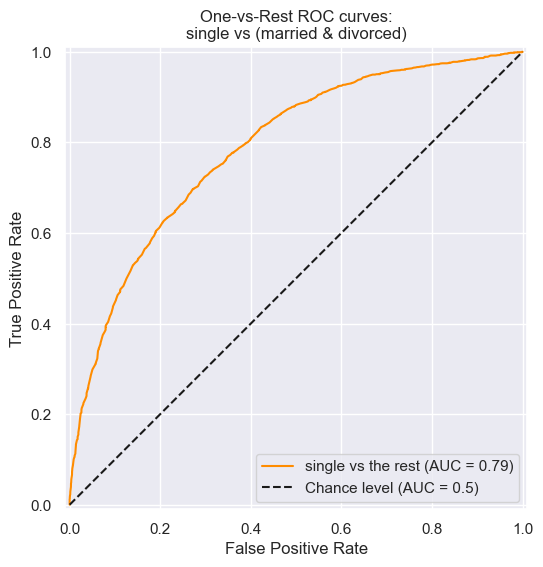

In [343]:
class_of_interest = ["divorced", "married", "single"]
display_single = RocCurveDisplay.from_predictions(
    y_onehot_test[:, 2],
    y_score[:, 2],
    name=f"{class_of_interest[2]} vs the rest",
    color="darkorange",
    plot_chance_level=True,
)
_ = display_single.ax_.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="One-vs-Rest ROC curves:\nsingle vs (married & divorced)",
)

In a multi-class classification setup with highly imbalanced classes, micro-averaging is preferable over macro-averaging. In such cases, one can alternatively use a weighted macro-averaging, not demoed by us here. It is also good to know that by default, the computation of the ROC curve adds a single point at the maximal false positive rate by using linear interpolation and the McClish correction.

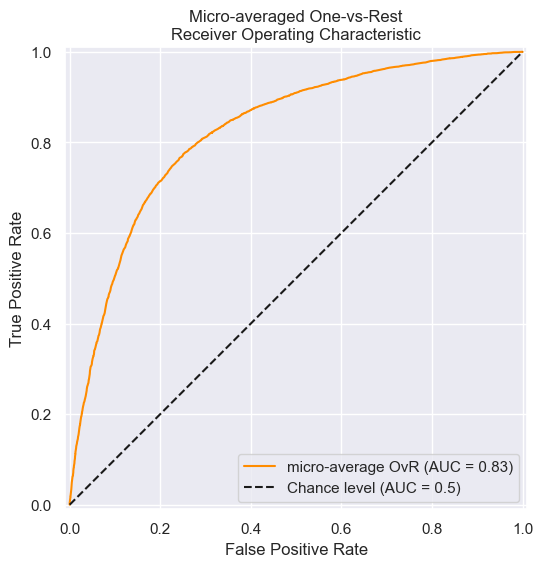

In [336]:
display_micro = RocCurveDisplay.from_predictions(
    y_onehot_test.ravel(),
    y_score.ravel(),
    name="micro-average OvR",
    color="darkorange",
    plot_chance_level=True,
)
_ = display_micro.ax_.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Micro-averaged One-vs-Rest\nReceiver Operating Characteristic",
)

In the case where the main interest is not the plot but the ROC-AUC score itself, we can reproduce the value shown in the plot using __roc_auc_score__.

In [344]:
micro_roc_auc_ovr = roc_auc_score( # test
    y_test,
    y_score,
    multi_class="ovr",
    average="micro",
)

print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{micro_roc_auc_ovr:.2f}")

Micro-averaged One-vs-Rest ROC AUC score:
0.83


Another approach for the same score:

In [345]:
fpr, tpr, roc_auc = dict(), dict(), dict()
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_onehot_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['micro']:.2f}")

Micro-averaged One-vs-Rest ROC AUC score:
0.83


And below, we collect all above solution in one visual:

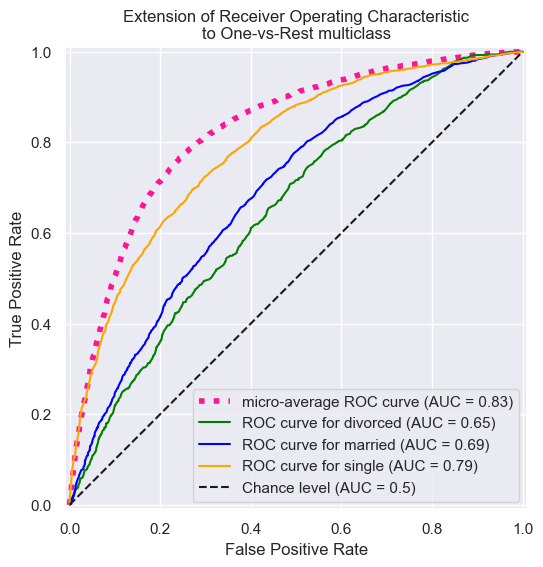

In [339]:
fig, ax = plt.subplots(figsize=(6, 6))

plt.plot(fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4
    )

colors = cycle(["green", "blue", "orange"])
for class_id, color in zip(range(3), colors):
    RocCurveDisplay.from_predictions(
        y_onehot_test[:, class_id],
        y_score[:, class_id],
        name=f"ROC curve for {class_of_interest[class_id]}",
        color=color,
        ax=ax,
        plot_chance_level=(class_id == 2),
    )

_ = ax.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Extension of Receiver Operating Characteristic\nto One-vs-Rest multiclass",
)

To sum up, ROC curve is a chart illustrating the operation of a binary classifier, i.e. an algorithm predicting whether an object belongs to one of two classes. It is used in situations where the classifier does not provide a clear yes/no decision, but returns a result on an ordinal or numerical scale (e.g. in the form of probability).

At the end, we want to obtain decision boundaries using Linear regression.

In [340]:
scatter_plot_X_LR = X_LR.copy()
scatter_plot_X_LR["marital"] = y_binary
scatter_plot_X_LR.head()
num_selected = 1000
scatter_plot_X_LR.sample(num_selected)

,age,cons.conf.idx,marital
37109,0.243106,0.595238,2
22032,0.155405,0.700000,1
12472,0.124244,0.385714,2
24397,0.176271,0.419048,2
17759,0.155405,0.700000,2
...,...,...,...
25468,0.260764,0.419048,0
17436,0.201232,0.700000,1
2593,0.207015,0.685714,2
781,0.182801,0.685714,1


Text(0.5, 1.0, 'Decision boundaries using Logistic regression')

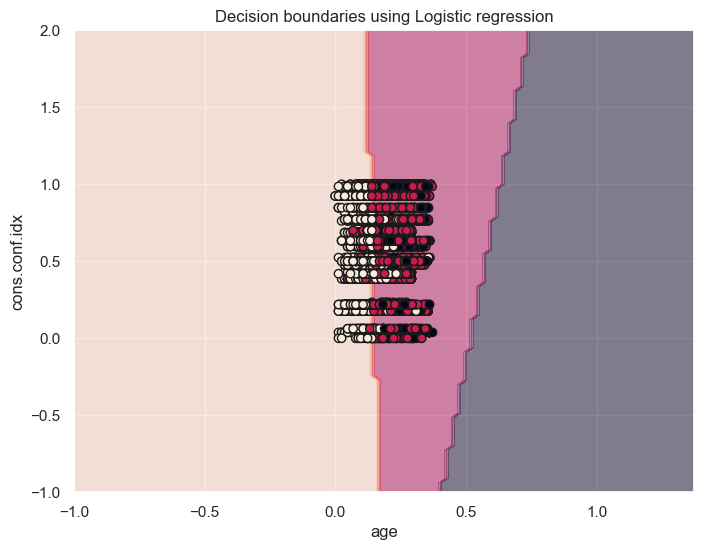

In [341]:
X = scatter_plot_X_LR.iloc[:, :2]
y = scatter_plot_X_LR.iloc[:, 2]
classifier = LogisticRegression().fit(X, y)
disp = DecisionBoundaryDisplay.from_estimator(
    classifier, X, response_method="predict",
    xlabel=X.columns[0], ylabel=X.columns[1],
    alpha=0.5
 )
disp.ax_.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, edgecolor="k")
plt.title("Decision boundaries using Logistic regression")

As we can see, it is not the best division into groups so we probably should consider to use more complicated algorithms.